# FX signals with ML and common sense

## Get packages and JPMaQS data

In [1]:
import os
import numpy as np
import pandas as pd

from sklearn.pipeline import Pipeline
from sklearn.linear_model import LinearRegression, ElasticNet
from sklearn.ensemble import RandomForestRegressor

from sklearn.metrics import (
    make_scorer,
    r2_score,
)

import macrosynergy.management as msm
import macrosynergy.panel as msp
import macrosynergy.pnl as msn
import macrosynergy.signal as mss
import macrosynergy.learning as msl
import macrosynergy.visuals as msv

from macrosynergy.download import JPMaQSDownload

import warnings

warnings.simplefilter("ignore")

In [2]:
# Cross-sections of interest - FX
cids_g3 = ["EUR", "USD"]  # DM large currency areas
cids_dmfx = ["AUD", "CAD", "CHF", "GBP", "JPY", "NOK", "NZD", "SEK"]  # 8 DM currency areas
cids_emfx = ["CZK", "ILS", "KRW", "MXN", "PLN", "THB", "TWD", "ZAR"]  # 8 EM currency areas

cids_fx = cids_dmfx + cids_emfx

cids_dm = cids_g3 + cids_dmfx
cids = cids_dm + cids_emfx

cids_eur = ["CHF", "NOK", "SEK", "PLN", "HUF", "CZK"]  # trading against EUR
cids_eud = ["GBP"]  # trading against EUR and USD
cids_usd = list(set(cids_fx) - set(cids_eur + cids_eud))  # trading against USD

In [3]:
# Quantamental categories for factor and target calculations

xbds = [
    "MTBGDPRATIO_SA_3MMA_D1M1ML3",
    "MTBGDPRATIO_SA_6MMA_D1M1ML6",
    "MTBGDPRATIO_NSA_12MMA_D1M1ML3",
    "BXBGDPRATIO_NSA_12MMA_D1M1ML3"
]

xbrs = [
    "CABGDPRATIO_NSA_12MMA",
    "BXBGDPRATIO_NSA_12MMA"
]

pcg = [
    "PCREDITBN_SJA_P1M1ML12"
]

ipgs = [
    "IP_SA_P6M6ML6AR",
    "IP_SA_P1M1ML12_3MMA"
]

ir = [
    "RIR_NSA",
]

ctots = [
    "CTOT_NSA_P1M1ML12",
    "CTOT_NSA_P1M12ML1",
    "CTOT_NSA_P1W4WL1",
]

surv = [
    "MBCSCORE_SA_D3M3ML3",
    "MBCSCORE_SA_D1Q1QL1",
    "MBCSCORE_SA_D6M6ML6",
    "MBCSCORE_SA_D2Q2QL2",
]

ppi = [
    "PGDPTECH_SA_P1M1ML12_3MMA",
    "PPIH_NSA_P1M1ML12_3MMA"
]

gdps = [
    "INTRGDP_NSA_P1M1ML12_3MMA",
    "RGDPTECH_SA_P1M1ML12_3MMA",
]

emp = [
    "UNEMPLRATE_SA_D3M3ML3",
    "UNEMPLRATE_SA_D6M6ML6",
    "UNEMPLRATE_SA_D1Q1QL1",
    "UNEMPLRATE_SA_D2Q2QL2",
    "UNEMPLRATE_NSA_3MMA_D1M1ML12",
    "UNEMPLRATE_NSA_D1Q1QL4",
]

iip = [
    "IIPLIABGDP_NSA_D1Mv2YMA",
    "IIPLIABGDP_NSA_D1Mv5YMA",
]

cpi = [
    "CPIC_SA_P1M1ML12",
    "CPIC_SJA_P6M6ML6AR",
    "CPIH_SA_P1M1ML12",
    "CPIH_SJA_P6M6ML6AR",   
    "INFE1Y_JA",
    "INFE2Y_JA",
    "INFE5Y_JA",
]

main = xbds + xbrs + pcg + ipgs + ir + ctots + surv + ppi + gdps + emp + iip + cpi

adds = [
    "INFTEFF_NSA",
    "RGDP_SA_P1Q1QL4_20QMM"
]

mkts = [
    "FXTARGETED_NSA",
    "FXUNTRADABLE_NSA",
]

rets = [
    "FXXR_NSA",
    "FXXR_VT10",
    "FXXRHvGDRB_NSA",
]

xcats = main + mkts + rets + adds

# Resultant tickers for download

single_tix = ["USD_GB10YXR_NSA", "EUR_FXXR_NSA", "USD_EQXR_NSA"]
tickers = [cid + "_" + xcat for cid in cids for xcat in xcats] + single_tix

In [4]:
# Download series from J.P. Morgan DataQuery by tickers

start_date = "1990-01-01"
end_date = None

# Retrieve credentials

oauth_id = os.getenv("DQ_CLIENT_ID")  # Replace with own client ID
oauth_secret = os.getenv("DQ_CLIENT_SECRET")  # Replace with own secret

# Download from DataQuery

downloader = JPMaQSDownload(client_id=oauth_id, client_secret=oauth_secret)
df = downloader.download(
    tickers=tickers,
    start_date=start_date,
    end_date=end_date,
    metrics=["value"],
    suppress_warning=True,
    show_progress=True,
)

dfx = df.copy()
dfx.info()

Timestamp UTC:  2024-12-20 09:56:12
Connection successful!


Requesting data: 100%|█████████████████████████████████████████████████████████████████| 39/39 [00:08<00:00,  4.83it/s]


Some expressions are missing from the downloaded data. Check logger output for complete list.
97 out of 776 expressions are missing. To download the catalogue of all available expressions and filter the unavailable expressions, set `get_catalogue=True` in the call to `JPMaQSDownload.download()`.
Some dates are missing from the downloaded data. 
2 out of 9127 dates are missing.
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5033333 entries, 0 to 5033332
Data columns (total 4 columns):
 #   Column     Dtype         
---  ------     -----         
 0   real_date  datetime64[ns]
 1   cid        object        
 2   xcat       object        
 3   value      float64       
dtypes: datetime64[ns](1), float64(1), object(2)
memory usage: 153.6+ MB


## Availability and blacklisting

### Renaming

Rename quarterly tickers to roughly equivalent monthly tickers to simplify subsequent operations.

In [5]:
dict_repl = {
    "UNEMPLRATE_NSA_D1Q1QL4": "UNEMPLRATE_NSA_3MMA_D1M1ML12",
    "UNEMPLRATE_SA_D1Q1QL1": "UNEMPLRATE_SA_D3M3ML3",
    "UNEMPLRATE_SA_D2Q2QL2": "UNEMPLRATE_SA_D6M6ML6",
    "MBCSCORE_SA_D1Q1QL1": "MBCSCORE_SA_D3M3ML3",
    "MBCSCORE_SA_D2Q2QL2": "MBCSCORE_SA_D6M6ML6",
}

for key, value in dict_repl.items():
    dfx["xcat"] = dfx["xcat"].str.replace(key, value)

### Check availability

Prior to commencing any analysis, it is crucial to evaluate the accessibility of data. This evaluation serves several purposes, including identifying potential data gaps or constraints within the dataset. Such gaps can significantly influence the trustworthiness and accuracy of the analysis. Moreover, it aids in verifying that ample observations are accessible for each chosen category and cross-section. Additionally, it assists in establishing suitable timeframes for conducting the analysis.

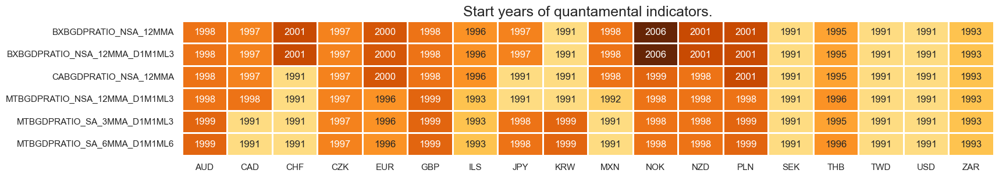

In [6]:
xcatx = xbds + xbrs
msm.check_availability(df=dfx, xcats=xcatx, cids=cids, missing_recent=False)

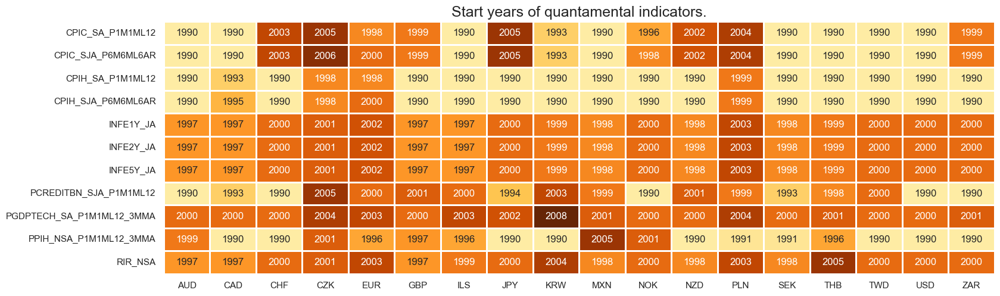

In [7]:
xcatx = cpi + ppi + ir + pcg
msm.check_availability(df=dfx, xcats=xcatx, cids=cids, missing_recent=False)

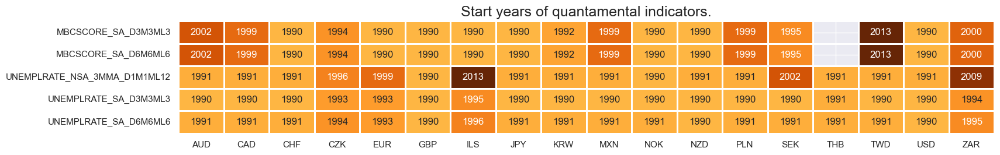

In [8]:
xcatx = surv + emp
msm.check_availability(df=dfx, xcats=xcatx, cids=cids, missing_recent=False)

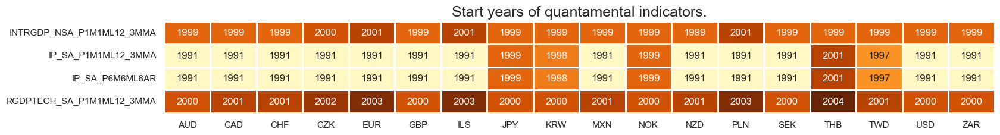

In [9]:
xcatx = gdps + ipgs
msm.check_availability(df=dfx, xcats=xcatx, cids=cids, missing_recent=False)

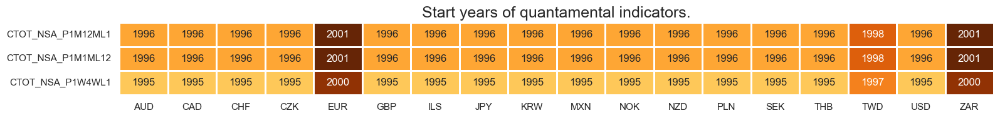

In [10]:
xcatx = ctots
msm.check_availability(df=dfx, xcats=xcatx, cids=cids, missing_recent=False)

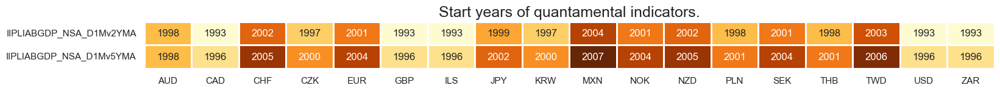

In [11]:
xcatx = iip
msm.check_availability(df=dfx, xcats=xcatx, cids=cids, missing_recent=False)

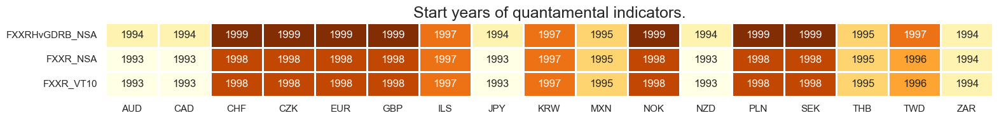

In [12]:
xcatx = rets
msm.check_availability(df=dfx, xcats=xcatx, cids=cids, missing_recent=False)

### Blacklisting

Identifying and isolating periods of official exchange rate targets, illiquidity, or convertibility-related distortions in FX markets is the first step in creating an FX trading strategy. These periods can significantly impact the behavior and dynamics of currency markets, and failing to account for them can lead to inaccurate or misleading findings. A standard blacklist dictionary (`fxblack` in the cell below) can be passed to several [`macrosynergy`](https://github.com/macrosynergy/macrosynergy) package functions that exclude the blacklisted periods from related analyses. 

In [13]:
# Create blacklisting dictionary

dfb = df[df["xcat"].isin(["FXTARGETED_NSA", "FXUNTRADABLE_NSA"])].loc[
    :, ["cid", "xcat", "real_date", "value"]
]
dfba = (
    dfb.groupby(["cid", "real_date"])
    .aggregate(value=pd.NamedAgg(column="value", aggfunc="max"))
    .reset_index()
)
dfba["xcat"] = "FXBLACK"
fxblack = msp.make_blacklist(dfba, "FXBLACK")
fxblack

{'CHF': (Timestamp('2011-10-03 00:00:00'), Timestamp('2015-01-30 00:00:00')),
 'CZK': (Timestamp('2014-01-01 00:00:00'), Timestamp('2017-07-31 00:00:00')),
 'ILS': (Timestamp('1999-01-01 00:00:00'), Timestamp('2005-12-30 00:00:00')),
 'THB': (Timestamp('2007-01-01 00:00:00'), Timestamp('2008-11-28 00:00:00'))}

## Factor computation and checks

### Single-concept calculations

In [14]:
# Initiate factor dictionary

factors = {}

#### International liabilities trends

In [15]:
# Combine to single trend measure
cidx = cids
xcatx = [
    "IIPLIABGDP_NSA_D1Mv2YMA",
    "IIPLIABGDP_NSA_D1Mv5YMA",
]
xtic = "IIPLIABGDP_D"
label = "International liabilities trend"

dfa = msp.linear_composite(
    dfx,
    xcats=xcatx,
    cids=cidx,
    weights=[1/2, 1/5],
    normalize_weights=True,
    complete_xcats=False,
    new_xcat=xtic,
)

dfx = msm.update_df(dfx, dfa)
factors[xtic] =[label, "ABS", "NEG"]  # info on benchmark/sign adjustments

#### External balances trends

In [16]:
# Combine to single trend measure
cidx = cids
xcatx = [
    "MTBGDPRATIO_SA_3MMA_D1M1ML3",
    "MTBGDPRATIO_SA_6MMA_D1M1ML6",
    "BXBGDPRATIO_NSA_12MMA_D1M1ML3"
]
xtic = "XBAL_D"
label = "External balances change"

dfa = msp.linear_composite(
    dfx,
    xcats=xcatx,
    cids=cidx,
    weights=[1, 1/2, 1],
    normalize_weights=True,
    complete_xcats=False,
    new_xcat=xtic,
)

dfx = msm.update_df(dfx, dfa)
factors[xtic] =[label, "ABS", "POS"]  # info on benchmark/sign adjustments

#### External balances ratios

In [17]:
# Combine to single ratio
cidx = cids
xcatx = [
    "CABGDPRATIO_NSA_12MMA",
    "BXBGDPRATIO_NSA_12MMA"
]
xtic = "XBALR"
label = "External balances ratios"

dfa = msp.linear_composite(
    dfx,
    xcats=xcatx,
    cids=cidx,
    normalize_weights=True,
    complete_xcats=False,
    new_xcat=xtic,
)

dfx = msm.update_df(dfx, dfa)
factors[xtic] =[label, "ABS", "POS"]  # info on benchmark/sign adjustments

#### Unemployment rate changes

In [18]:
# Combine to annualized change average
xcatx = [
    "UNEMPLRATE_SA_D3M3ML3",
    "UNEMPLRATE_SA_D6M6ML6",
    "UNEMPLRATE_NSA_3MMA_D1M1ML12",
]
cidx = cids
xtic = "URATE_D"
label = "Unemployment rate change"

dfa = msp.linear_composite(
    dfx,
    xcats=xcatx,
    cids=cidx,
    weights=[4, 2, 1],
    normalize_weights=True,
    complete_xcats=False,
    new_xcat=xtic,
)

dfx = msm.update_df(dfx, dfa)
factors[xtic] =[label, "REL", "NEG"]  # info on benchmark/sign adjustments

#### Excess CPI inflation pressure

In [19]:
cidx = cids
xcatx = [
    "CPIC_SA_P1M1ML12",
    "CPIC_SJA_P6M6ML6AR",
    "CPIH_SA_P1M1ML12",
    "CPIH_SJA_P6M6ML6AR",
    "INFE1Y_JA",
    "INFE2Y_JA",
    "INFE5Y_JA",
]

dfa = msp.linear_composite(
    dfx,
    xcats=xcatx,
    cids=cidx,
    complete_xcats=False,
    new_xcat="INF",
)

dfx = msm.update_df(dfx, dfa)

In [20]:
cidx = cids
xtic = "XINF"
label = "Excess CPI inflation pressure"

calcs = [f"{xtic} = INF - INFTEFF_NSA"]
dfa = msp.panel_calculator(dfx, calcs=calcs, cids=cidx)
dfx = msm.update_df(dfx, dfa)
factors[xtic] =[label, "REL", "POS"]  # info on benchmark/sign adjustments

#### Excess producer price inflation

In [21]:
cidx = cids
xcatx = [
    "PGDPTECH_SA_P1M1ML12_3MMA",
    "PPIH_NSA_P1M1ML12_3MMA"
]

dfa = msp.linear_composite(
    dfx,
    xcats=xcatx,
    cids=cidx,
    complete_xcats=False,
    new_xcat="PPI_P",
)

dfx = msm.update_df(dfx, dfa)

In [22]:
cidx = cids
xtic = "XPPI_P"
label = "Excess producer inflation"

calcs = [f"{xtic} = PPI_P - INFTEFF_NSA"]   
dfa = msp.panel_calculator(dfx, calcs=calcs, cids=cidx)
dfx = msm.update_df(dfx, dfa)
factors[xtic] =[label, "REL", "POS"]  # info on benchmark/sign adjustments

#### Real credit growth

In [23]:
cidx = cids
xtic = "RPCREDIT_P"
label = "Real credit growth"

calcs = [f"{xtic} = PCREDITBN_SJA_P1M1ML12 - INFTEFF_NSA"]
dfa = msp.panel_calculator(dfx, calcs=calcs, cids=cidx)
dfx = msm.update_df(dfx, dfa)
factors[xtic] =[label, "REL", "POS"]  # info on benchmark/sign adjustments

#### Real GDP growth estimates

In [24]:
cidx = cids
xcatx = [
    "RGDPTECH_SA_P1M1ML12_3MMA",
    "INTRGDP_NSA_P1M1ML12_3MMA",
]
xtic = "RGDP_P"
label = "Real GDP growth"

dfa = msp.linear_composite(
    dfx,
    xcats=xcatx,
    cids=cidx,
    complete_xcats=False,
    new_xcat=xtic,
)

dfx = msm.update_df(dfx, dfa)
factors[xtic] =[label, "REL", "POS"]  # info on benchmark/sign adjustments

#### Industrial production growth

In [25]:
cidx = cids
xcatx = [
    "IP_SA_P6M6ML6AR",
    "IP_SA_P1M1ML12_3MMA"
]
xtic = "IP_P"
label = "Industry growth"

dfa = msp.linear_composite(
    dfx,
    xcats=xcatx,
    cids=cidx,
    complete_xcats=False,
    new_xcat=xtic,
)

dfx = msm.update_df(dfx, dfa)
factors[xtic] =[label, "REL", "POS"]  # info on benchmark/sign adjustments

#### Manufacturing confidence improvement

In [26]:
cidx = cids
xcatx = ["MBCSCORE_SA_D3M3ML3", "MBCSCORE_SA_D6M6ML6"]
xtic = "MBSCORE_D"
label = "Manufacturing confidence change"

dfa = msp.linear_composite(
    dfx,
    xcats=xcatx,
    cids=cidx,
    weights=[2, 1],
    normalize_weights=True,
    complete_xcats=False,
    new_xcat=xtic,
)
dfx = msm.update_df(dfx, dfa)
factors[xtic] =[label, "ABS", "POS"]  # info on benchmark/sign adjustments

#### Commodity-based terms of trade improvement

In [27]:
cidx = cids
xcatx = ["CTOT_NSA_P1M1ML12", "CTOT_NSA_P1M12ML1", "CTOT_NSA_P1W4WL1"]
xtic = "CTOT_P"
label = "Terms-of-trade change"

dfa = msp.linear_composite(
    dfx,
    xcats=xcatx,
    cids=cidx,
    weights=[1/12, 1/6, 2],
    normalize_weights=True,
    complete_xcats=False,
    new_xcat=xtic,
)
dfx = msm.update_df(dfx, dfa)
factors[xtic] =[label, "ABS", "POS"]  # info on benchmark/sign adjustments

### Transformations and visualizations

#### Relative values

In [28]:
# Calculate relative values to benchmark currency areas

xcatx = [f for f in factors.keys() if factors[f][1] == "REL"]

dfa_usd = msp.make_relative_value(dfx, xcatx, cids_usd, basket=["USD"], postfix="vBM")
dfa_eur = msp.make_relative_value(dfx, xcatx, cids_eur, basket=["EUR"], postfix="vBM")
dfa_eud = msp.make_relative_value(
    dfx, xcatx, cids_eud, basket=["EUR", "USD"], postfix="vBM"
)

dfa = pd.concat([dfa_eur, dfa_usd, dfa_eud])
dfx = msm.update_df(dfx, dfa)

# Modified factor dictionary

factors_r = {(f + "vBM" if k[1] == "REL" else f): k for f, k in factors.items()}

#### Negative values

In [29]:
# Negative values where required

xcatx = [f for f in factors_r.keys() if factors_r[f][2] == "NEG"]
calcs = []

for xc in xcatx:
    calcs += [f"{xc}_NEG = - {xc}"]

dfa = msp.panel_calculator(dfx, calcs=calcs, cids=cids_fx)
dfx = msm.update_df(dfx, dfa)

# Modified factor dictionary

factors_rn = {(f + "_NEG" if k[2] == "NEG" else f): k for f, k in factors_r.items()}


#### Normalization

In [30]:
# Zn-scores

xcatx = [f for f in factors_rn.keys()]
cidx = cids_fx

dfa = pd.DataFrame(columns=list(dfx.columns))

for xc in xcatx:
    dfaa = msp.make_zn_scores(
        dfx,
        xcat=xc,
        cids=cidx,
        sequential=True,
        min_obs=261 * 3,
        neutral="zero",
        pan_weight=1,
        thresh=3,
        postfix="_ZN",
        est_freq="m",
    )
    dfa = msm.update_df(dfa, dfaa)

dfx = msm.update_df(dfx, dfa)

# Modified factor dictionary

factorz = {f + "_ZN": k for f, k in factors_rn.items()}

In [31]:
# Labels dictionary

xtix = [f for f in factorz.keys()] 
labs = [
    (
        "Relative " + v[0][:1].lower() + v[0][1:] + ", negative"
        if v[1] == "REL" and v[2] == "NEG"
        else (
            "Relative " + v[0][:1].lower() + v[0][1:]
            if v[1] == "REL" and v[2] == "POS"
            else v[0] + ", negative" if v[2] == "NEG" else v[0]
        )
    )
    for v in factorz.values()
]

factorz_labs = dict(zip(xtix, labs))

#### Visual checks

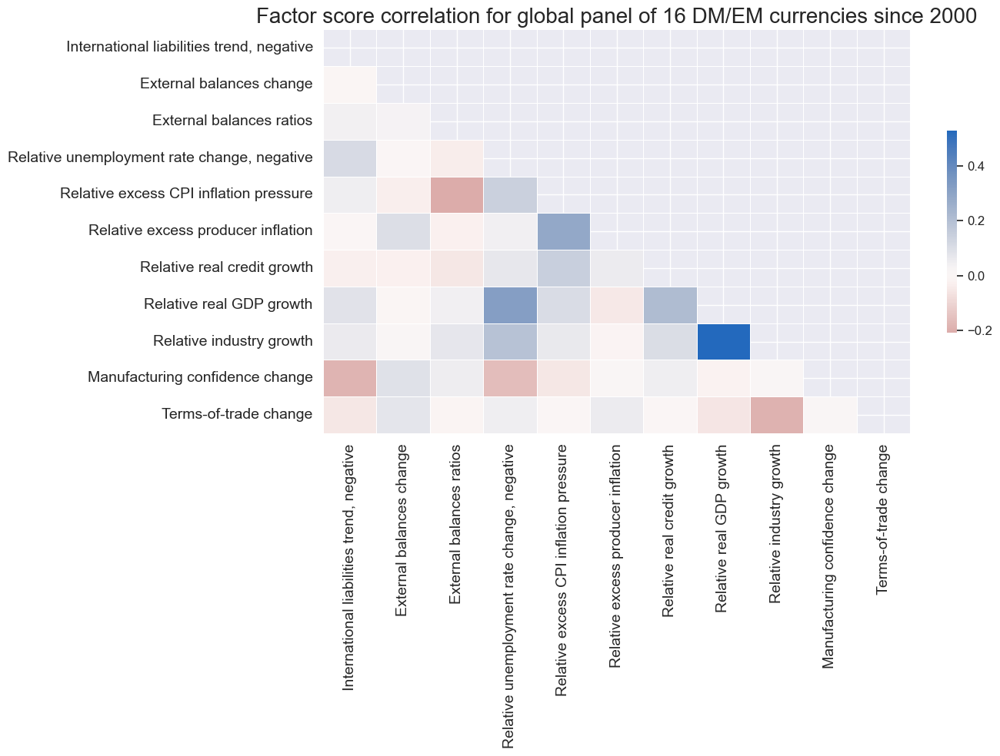

In [32]:
cidx = cids_fx
xcatx = [f for f in factorz.keys()]

sdate = "2000-01-01"

renaming_dict = factorz_labs

dfx_corr = dfx.copy()

for key, value in renaming_dict.items():
    dfx_corr["xcat"] = dfx_corr["xcat"].str.replace(key, value)

msp.correl_matrix(
    dfx_corr,
    xcats=list(renaming_dict.values()),
    cids=cidx,
    start=sdate,
    freq="M",
    cluster=False,
    title="Factor score correlation for global panel of 16 DM/EM currencies since 2000",
    size=(14, 10),
)

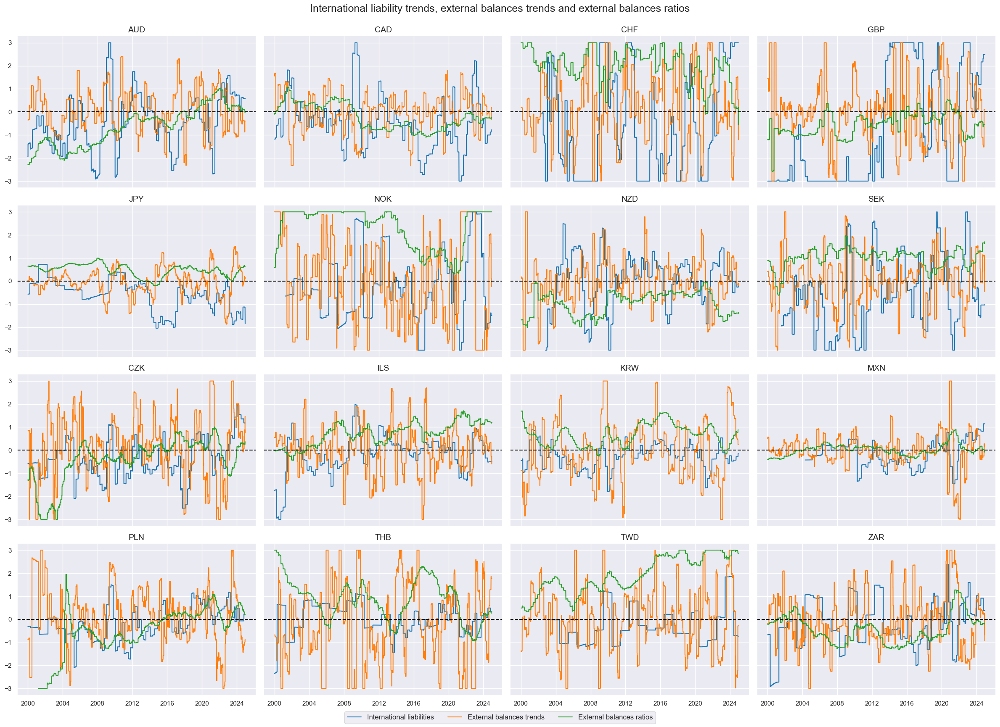

In [33]:
exts = [
    "IIPLIABGDP_D_NEG_ZN",
    "XBAL_D_ZN",
    "XBALR_ZN",
]
cidx = cids_fx
xcatx = exts

msp.view_timelines(
    df=dfx,
    xcats=xcatx,
    cids=cidx,
    start="2000-01-01",
    aspect=1.4,
    ncol=4,
    title = "International liability trends, external balances trends and external balances ratios",
    xcat_labels = ["International liabilities", "External balances trends", "External balances ratios"]
)

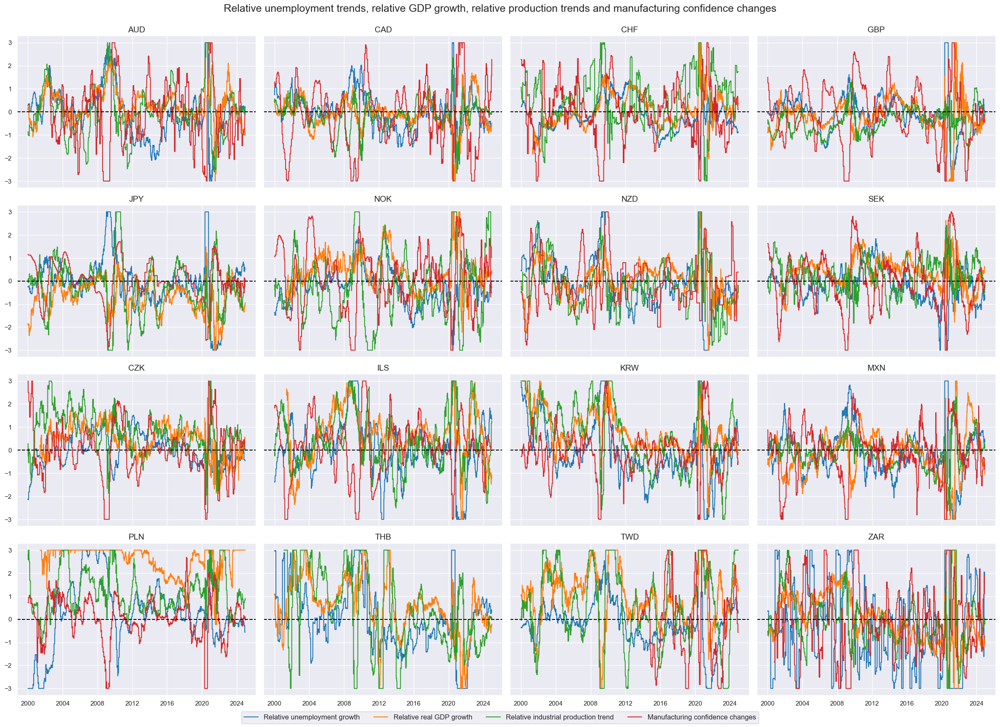

In [34]:
acts = [
    "URATE_DvBM_NEG_ZN",
    "RGDP_PvBM_ZN",
    "IP_PvBM_ZN",
    "MBSCORE_D_ZN",
]

cidx = cids_fx
xcatx = acts

msp.view_timelines(
    df=dfx,
    xcats=xcatx,
    cids=cidx,
    start="2000-01-01",
    aspect=1.4,
    ncol=4,
    title = "Relative unemployment trends, relative GDP growth, relative production trends and manufacturing confidence changes",
    xcat_labels = ["Relative unemployment growth", "Relative real GDP growth", "Relative industrial production trend", "Manufacturing confidence changes"]
)

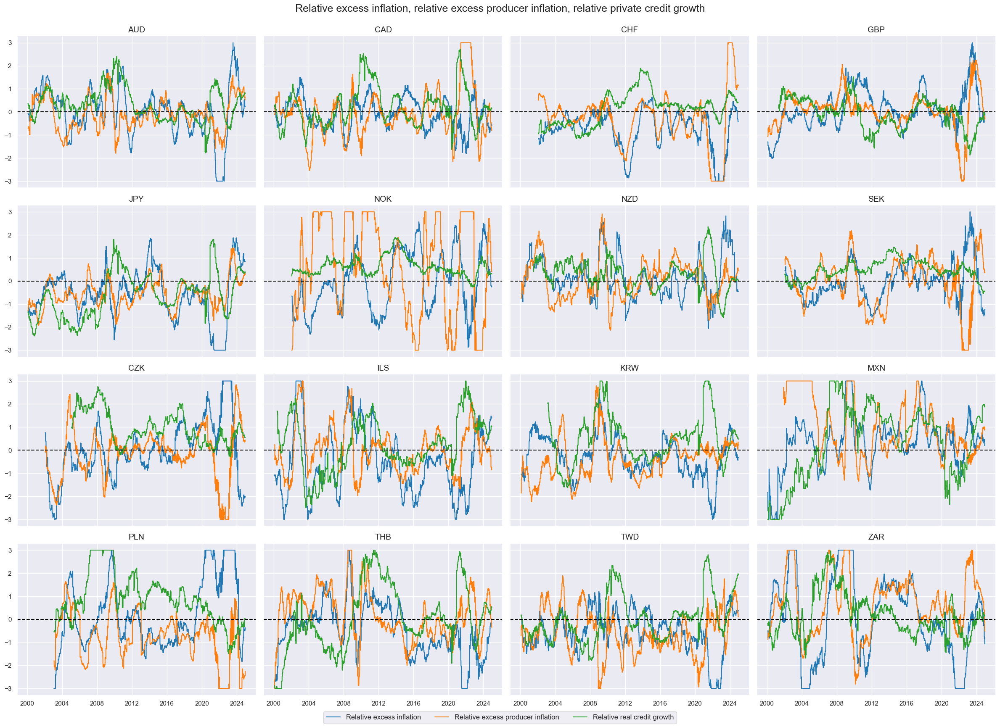

In [35]:
incs = [
    "XINFvBM_ZN",
    "XPPI_PvBM_ZN",
    "RPCREDIT_PvBM_ZN",
]

cidx = cids_fx
xcatx = incs

msp.view_timelines(
    df=dfx,
    xcats=xcatx,
    cids=cidx,
    start="2000-01-01",
    aspect=1.4,
    ncol=4,
    title = "Relative excess inflation, relative excess producer inflation, relative private credit growth",
    xcat_labels = ["Relative excess inflation", "Relative excess producer inflation", "Relative real credit growth"]
)

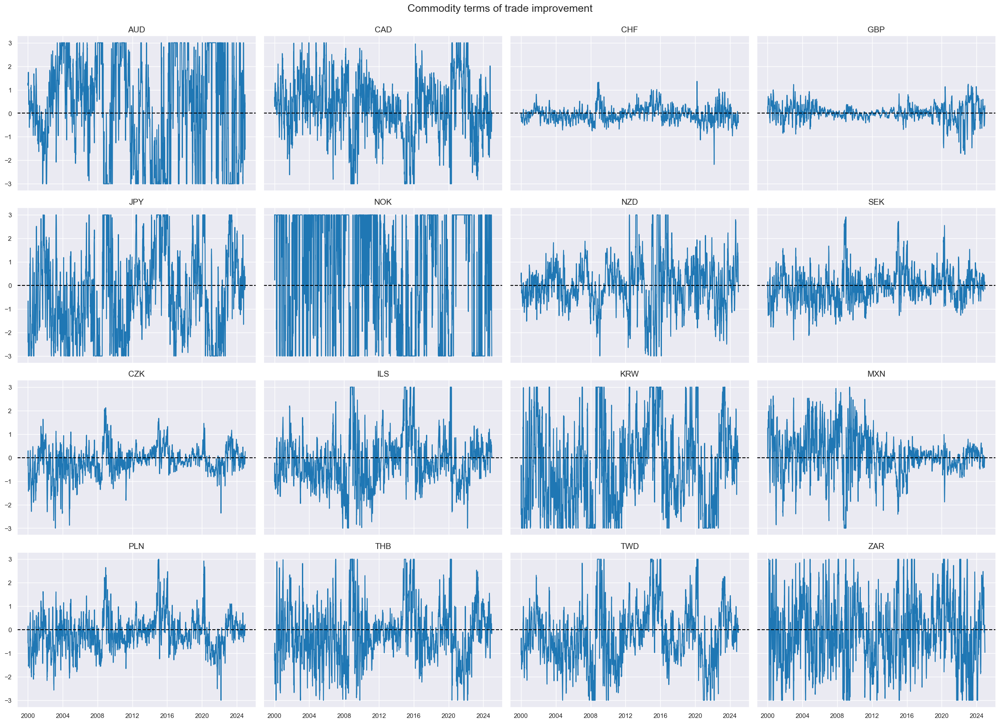

In [36]:
cidx = cids_fx
xcatx = ["CTOT_P_ZN"]

msp.view_timelines(
    df=dfx,
    xcats=xcatx,
    cids=cidx,
    start="2000-01-01",
    aspect=1.4,
    ncol=4,
    title = "Commodity terms of trade improvement",
    xcat_labels = ["Terms of trade improvement"]
)

#### Availability checks and imputations

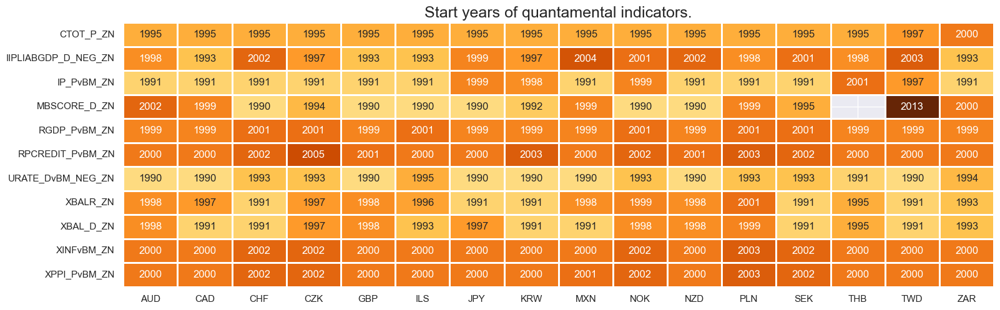

In [37]:
xcatx = [f for f in factorz.keys()]
dfxx = dfx.copy()
msm.check_availability(dfxx, xcatx, missing_recent=False)

In [38]:
cidx = cids_fx
xcatx = ["MBSCORE_D_ZN", "URATE_DvBM_NEG_ZN", "XBALR_ZN"]

dfa = msp.impute_panel(
    dfx, cidx, xcatx, threshold=0.8, impute_empty_tickers=True, start_date="2008-01-01"
)
dfx = msm.update_df(dfx, dfa)

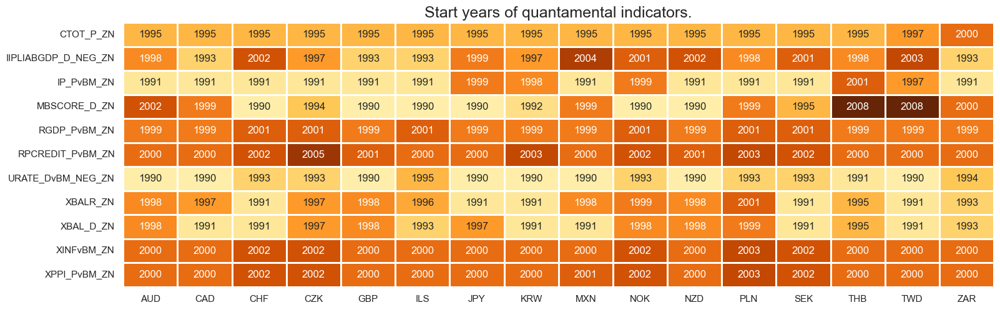

In [39]:
xcatx = [f for f in factorz.keys()]
msm.check_availability(dfx, xcatx, missing_recent=False)

### Target return checks

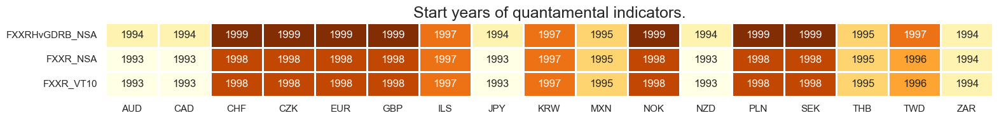

In [40]:
targs = [
    "FXXR_NSA",
    "FXXR_VT10",
    "FXXRHvGDRB_NSA",
]
xcatx = targs
msm.check_availability(dfx, xcatx, missing_recent=False)

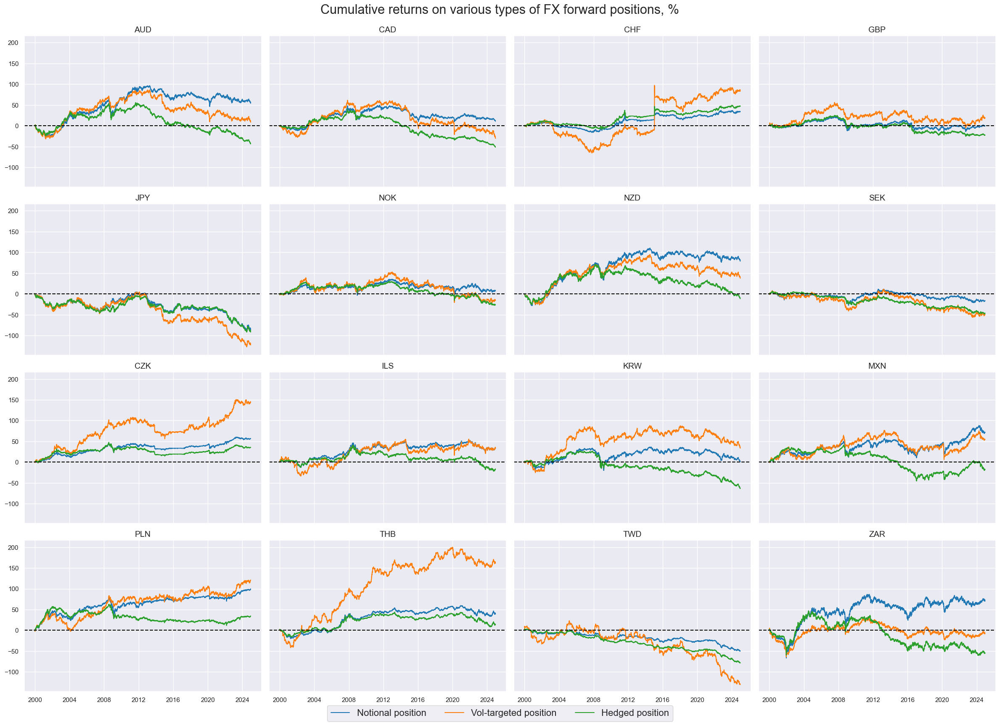

In [41]:
cidx = cids_fx
xcatx = targs

msp.view_timelines(
    df=dfx,
    xcats=xcatx,
    cids=cidx,
    title="Cumulative returns on various types of FX forward positions, %",
    title_fontsize=22,
    xcat_labels=["Notional position", "Vol-targeted position", "Hedged position"],
    cumsum=True,
    start="2000-01-01",
    aspect=1.4,
    ncol=4,
    legend_fontsize = 16,
)

## Preparations for statistical learning

### Conceptual parity as benchmark

In [42]:
# Linear equally-weighted combination of all available candidates

xcatx = [f for f in factorz.keys()]
cidx = cids_fx

dfax = msp.linear_composite(
    df=dfx,
    xcats=xcatx,
    cids=cidx,
    new_xcat="ALL_AVG",
)

dfa = msp.make_zn_scores(
        dfax,
        xcat="ALL_AVG",
        cids=cidx,
        sequential=True,
        min_obs=261 * 3,
        neutral="zero",
        pan_weight=1,
        thresh=3,
        postfix="Z",
        est_freq="m",
    )


dfx = msm.update_df(dfx, dfa)

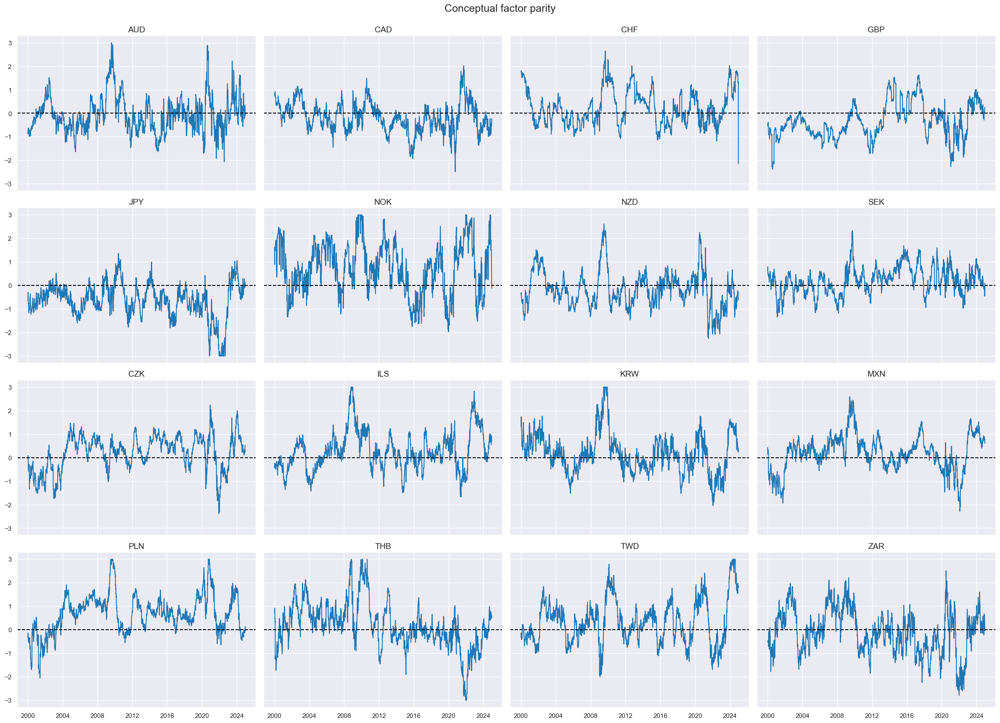

In [43]:
cidx = cids_fx
xcatx = ["ALL_AVGZ"]

msp.view_timelines(
    df=dfx,
    xcats=xcatx,
    cids=cidx,
    start="2000-01-01",
    aspect=1.4,
    ncol=4,
    title = "Conceptual factor parity",
)

### Convert data to scikit-learn format (redundant)

In [44]:
cidx = cids_fx
targ = "FXXR_VT10"
xcatx = [f for f in factorz.keys()] + [targ]

# Downsample from daily to monthly frequency (features as last and target as sum)
dfw = msm.categories_df(
    df=dfx,
    xcats=xcatx,
    cids=cidx,
    freq="M",
    lag=1,
    blacklist=fxblack,
    xcat_aggs=["last", "sum"],
)

# Drop rows with missing values and assign features and target
dfw.dropna(inplace=True)
X_fx = dfw.iloc[:, :-1]
y_fx = dfw.iloc[:, -1]

### Define splitter and scorer

In [45]:
splitter = msl.RollingKFoldPanelSplit(n_splits=5)
scorer = make_scorer(msl.sharpe_ratio, greater_is_better=True)

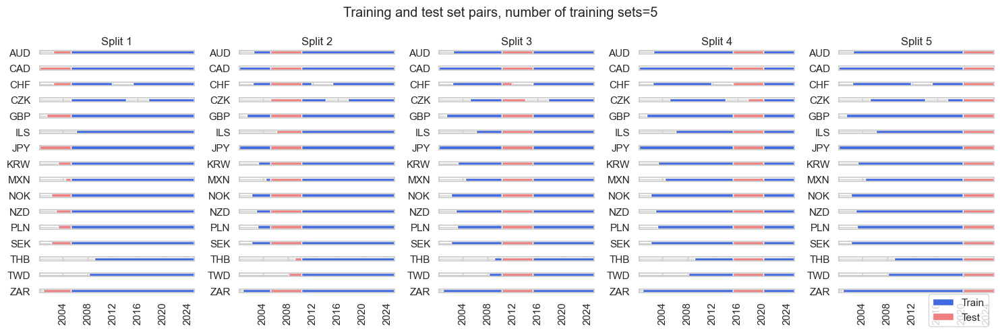

In [46]:
splitter.visualise_splits(X_fx, y_fx, figsize=(15, 5))

## Signal generation

### Grids

In [47]:
# Specify model options and grids

mods_mls = {
    "mls": msl.ModifiedLinearRegression(method="analytic", error_offset=1e-5),
}

grid_mls = {
    "mls": {"positive": [True, False], "fit_intercept": [True, False]},
}

In [48]:
# Random forest grid

mods_rf = {
    "rf_full": RandomForestRegressor(
        n_estimators = 200,
        max_features = "sqrt",
        max_samples = 0.1,
        random_state = 42,
    ),
    "rf_restricted": RandomForestRegressor(
        n_estimators = 200,
        max_features = "sqrt",
        max_samples = 0.1,
        monotonic_cst = [1 for i in range(len(factorz))],
        random_state = 42,
    )
}
    
grid_rf = {
    "rf_full": {},
    "rf_restricted": {},
}

### Learning vol-targeted positions

In [49]:
# Instantiation

xcatx = [f for f in factorz.keys()] + ["FXXR_VT10"]
cidx = cids_fx

so_fxv = msl.SignalOptimizer(
    df = dfx,
    xcats = xcatx,
    cids = cidx,
    blacklist = fxblack,
    freq = "M",
    lag = 1,
    xcat_aggs = ["last", "sum"]
)

In [50]:
# Learn with linear regression

so_fxv.calculate_predictions(
    name = "LSV",
    models = mods_mls,
    hyperparameters = grid_mls,
    scorers = {"sharpe": scorer},
    inner_splitters = {"Rolling": splitter},
    search_type = "grid",
    normalize_fold_results = False,
    cv_summary = "mean",
    min_cids = 2,
    min_periods = 36,
    test_size = 1,
    n_jobs_outer = -1,
    split_functions={"Rolling": lambda n: n // 36},
)

dfa = so_fxv.get_optimized_signals(name="LSV")
dfx = msm.update_df(dfx, dfa)

  0%|          | 0/262 [00:00<?, ?it/s]

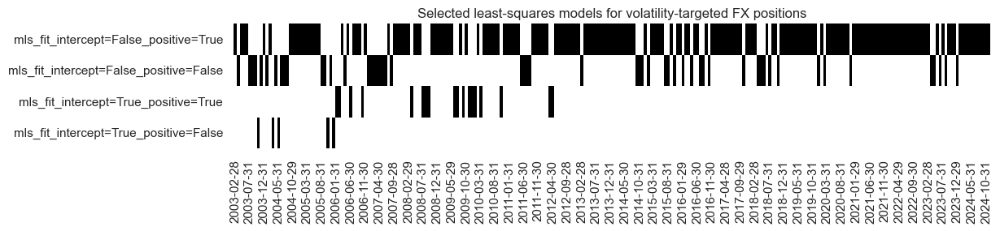

In [51]:
# Illustrate model choice

so_fxv.models_heatmap(
    "LSV",
    title="Selected least-squares models for volatility-targeted FX positions",
    figsize=(12, 2),
)

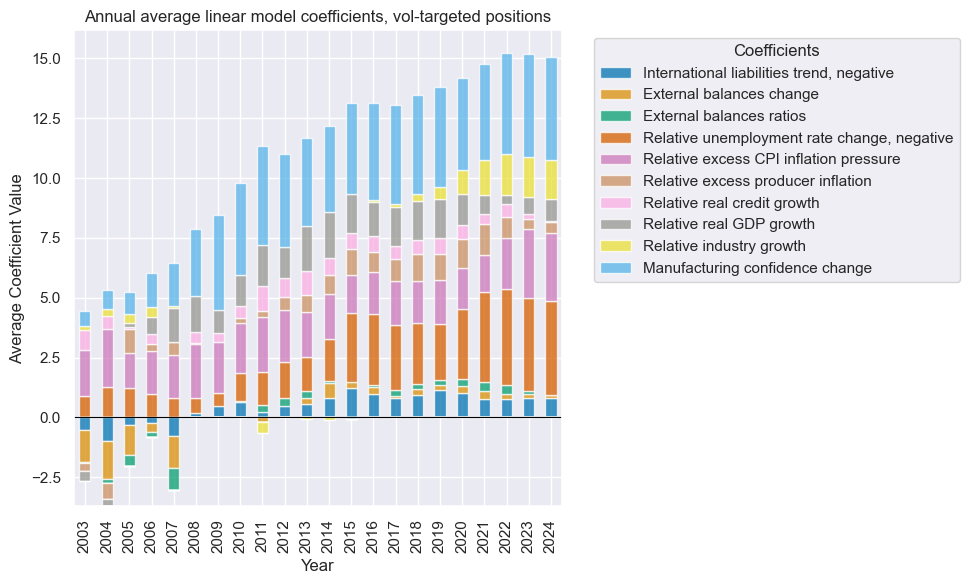

In [52]:
so_fxv.coefs_stackedbarplot(
    "LSV",
    title="Annual average linear model coefficients, vol-targeted positions",
    ftrs_renamed=factorz_labs,
)

In [53]:
# Learn with random forest

so_fxv.calculate_predictions(
    name = "RFV",
    models = mods_rf,
    hyperparameters = grid_rf,
    scorers = {"sharpe": scorer},
    inner_splitters = {"Rolling": splitter},
    search_type = "grid",
    normalize_fold_results = False,
    cv_summary = "mean",
    min_cids = 2,
    min_periods = 36,
    test_size = 1,
    n_jobs_outer = -1,
)

dfa = so_fxv.get_optimized_signals(name="RFV")
dfx = msm.update_df(dfx, dfa)

  0%|          | 0/262 [00:00<?, ?it/s]

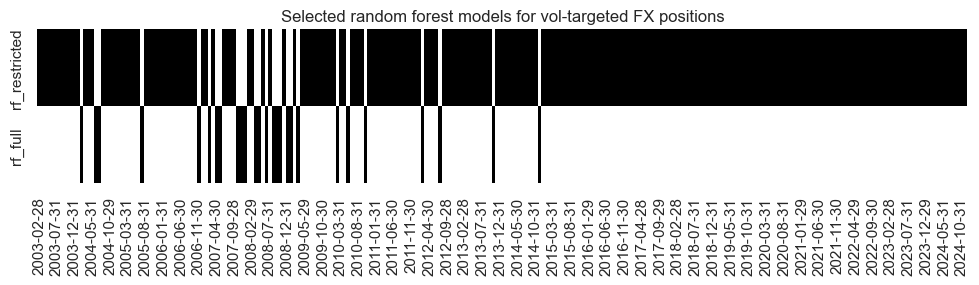

In [54]:
# Illustrate model choice

so_fxv.models_heatmap(
    "RFV",
    title="Selected random forest models for vol-targeted FX positions",
    figsize=(12, 2),
)

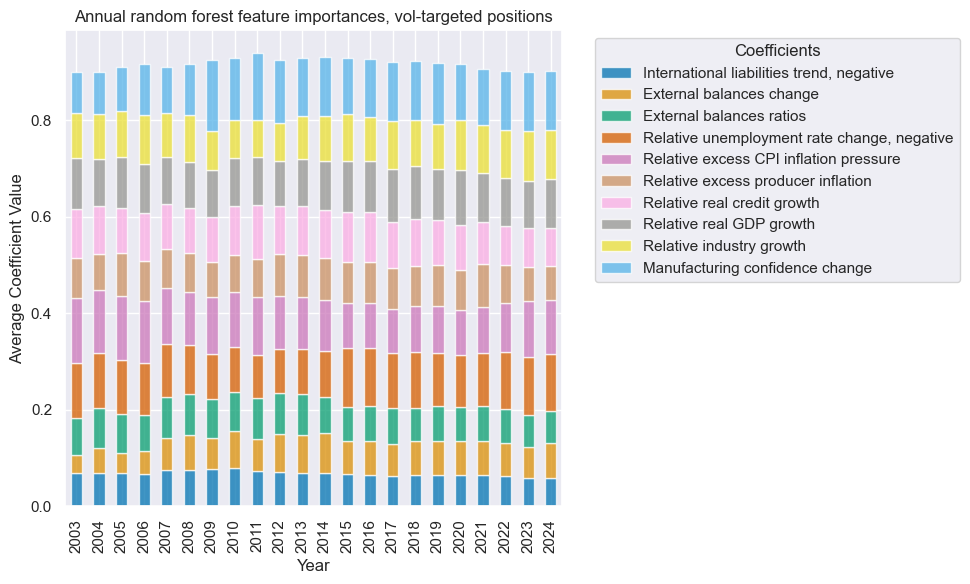

In [55]:
so_fxv.coefs_stackedbarplot(
    "RFV",
    title="Annual random forest feature importances, vol-targeted positions",
    ftrs_renamed=factorz_labs,
)

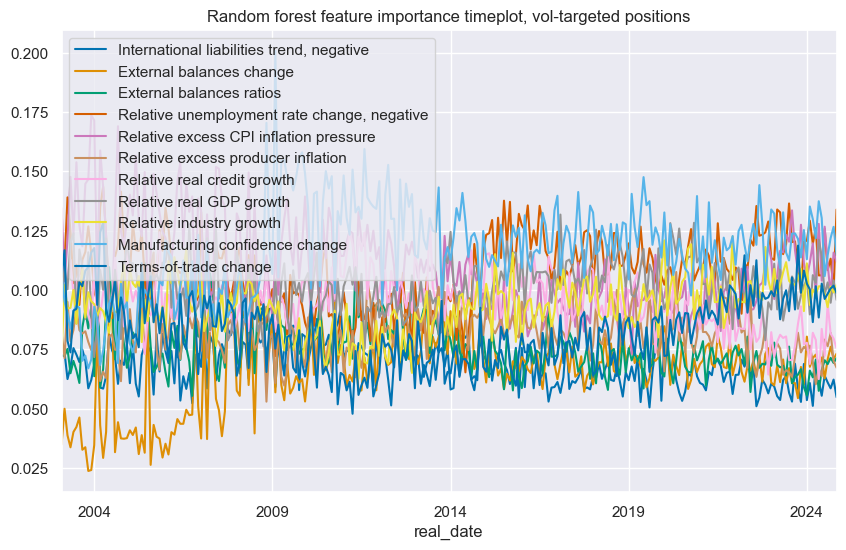

In [56]:
so_fxv.feature_importance_timeplot(
    "RFV",
    title="Random forest feature importance timeplot, vol-targeted positions",
    ftrs_renamed=factorz_labs,
)

In [57]:
# Zn-scores

xcatx = ["LSV", "RFV"]
cidx = cids_fx

dfa = pd.DataFrame(columns=list(dfx.columns))

for xc in xcatx:
    dfaa = msp.make_zn_scores(
        dfx,
        xcat=xc,
        cids=cidx,
        sequential=True,
        min_obs=261 * 3,
        neutral="zero",
        pan_weight=1,
        thresh=3,
        postfix="Z",
        est_freq="m",
    )
    dfa = msm.update_df(dfa, dfaa)

dfx = msm.update_df(dfx, dfa)

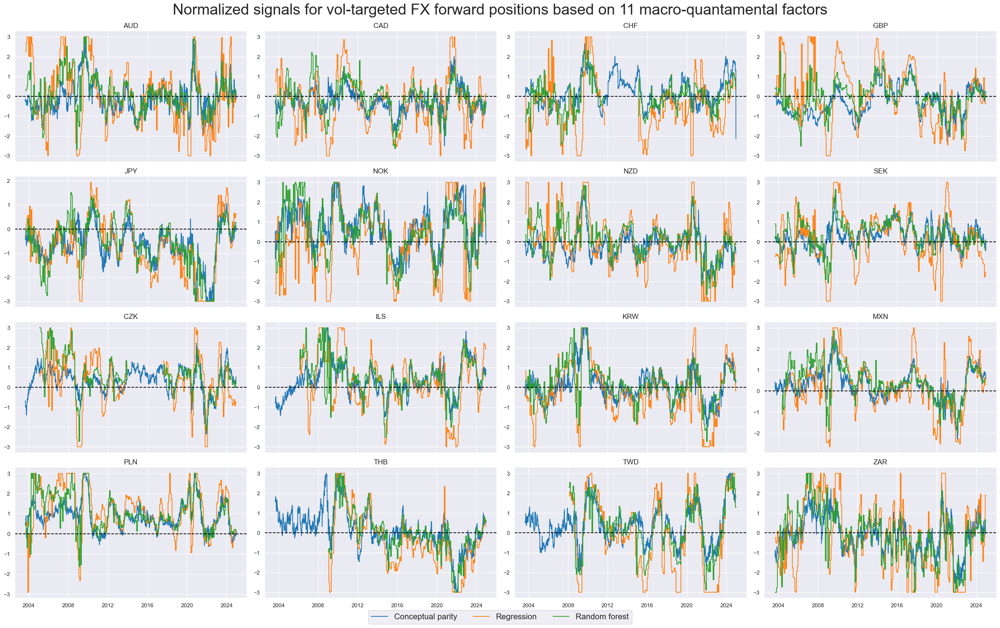

In [58]:
xcatx = ["ALL_AVGZ", "LSVZ", "RFVZ"]
cidx = cids_fx

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=4,
    start="2003-08-29",
    title = "Normalized signals for vol-targeted FX forward positions based on 11 macro-quantamental factors",
    xcat_labels = ["Conceptual parity", "Regression", "Random forest"],
    title_fontsize=30,
    same_y=False,
    cs_mean=False,
    legend_fontsize=16,
)

### Learning hedged positions

In [59]:
# Instantiation

xcatx = [f for f in factorz.keys()]  + ["FXXRHvGDRB_NSA"]
cidx = cids_fx

so_fxh = msl.SignalOptimizer(
    df = dfx,
    xcats = xcatx,
    cids = cidx,
    blacklist = fxblack,
    freq = "M",
    lag = 1,
    xcat_aggs = ["last", "sum"]
)

In [60]:
# Learn with linear regression

so_fxh.calculate_predictions(
    name = "LSH",
    models = mods_mls,
    hyperparameters = grid_mls,
    scorers = {"sharpe": scorer},
    inner_splitters = {"Rolling": splitter},
    search_type = "grid",
    normalize_fold_results = False,
    cv_summary = "mean",
    min_cids = 2,
    min_periods = 36,
    test_size = 1,
    n_jobs_outer = -1,
    split_functions={"Rolling": lambda n: n // 36},
)

dfa = so_fxh.get_optimized_signals(name="LSH")
dfx = msm.update_df(dfx, dfa)

  0%|          | 0/262 [00:00<?, ?it/s]

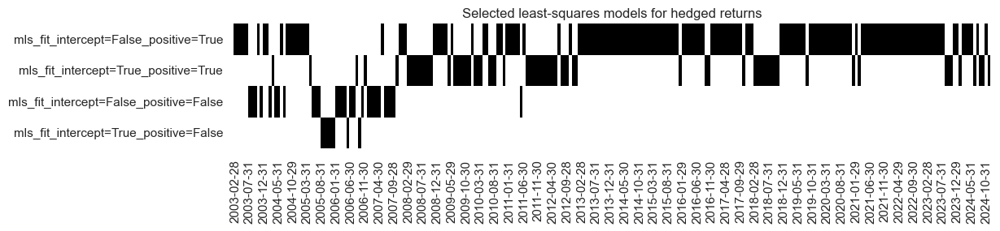

In [61]:
# Illustrate model choice

so_fxh.models_heatmap(
    "LSH",
    title="Selected least-squares models for hedged returns",
    figsize=(12, 2),
)

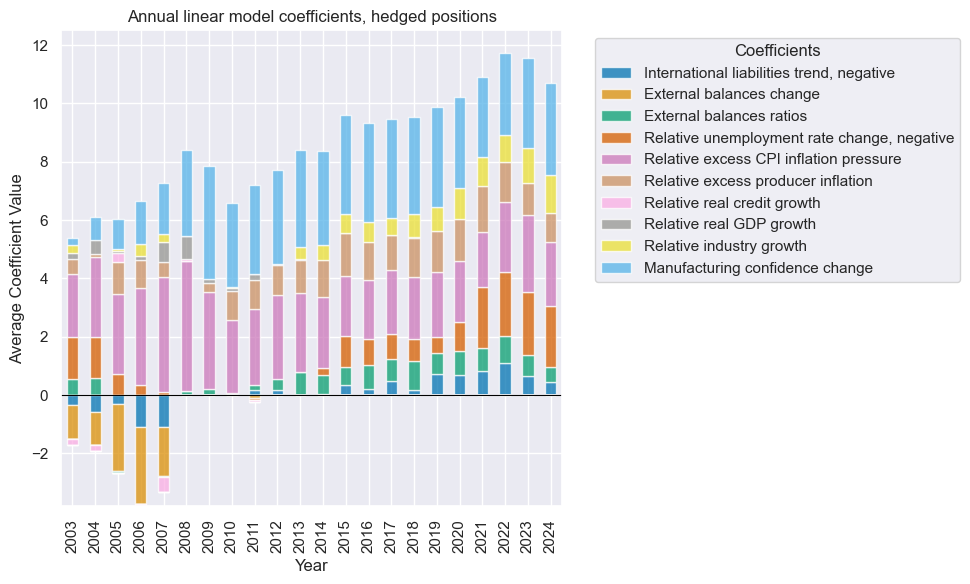

In [62]:
so_fxh.coefs_stackedbarplot(
    "LSH",
    title="Annual linear model coefficients, hedged positions",
    ftrs_renamed=factorz_labs,
)

In [63]:
# Learn with random forest

so_fxh.calculate_predictions(
    name = "RFH",
    models = mods_rf,
    hyperparameters = grid_rf,
    scorers = {"sharpe": scorer},
    inner_splitters = {"Rolling": splitter},
    search_type = "grid",
    normalize_fold_results = False,
    cv_summary = "mean",
    min_cids = 2,
    min_periods = 36,
    test_size = 1,
    n_jobs_outer = -1,
)

dfa = so_fxh.get_optimized_signals()
dfx = msm.update_df(dfx, dfa)

  0%|          | 0/262 [00:00<?, ?it/s]

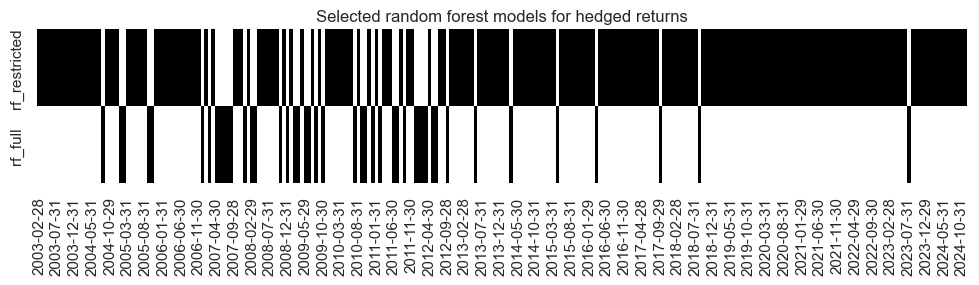

In [64]:
# Illustrate model choice

so_fxh.models_heatmap(
    "RFH",
    title="Selected random forest models for hedged returns",
    figsize=(12, 2),
)

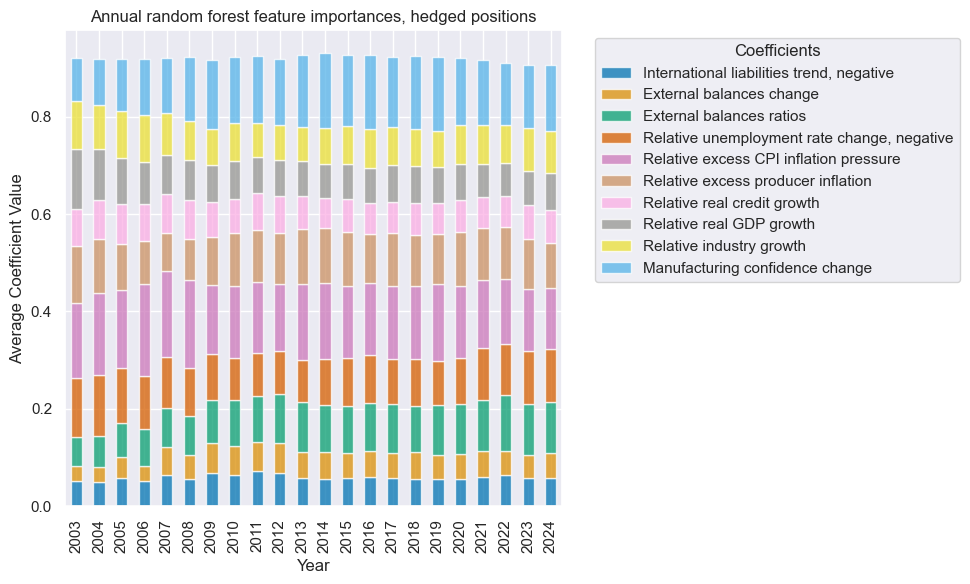

In [65]:
so_fxh.coefs_stackedbarplot(
    "RFH",
    title="Annual random forest feature importances, hedged positions",
    ftrs_renamed=factorz_labs,
)

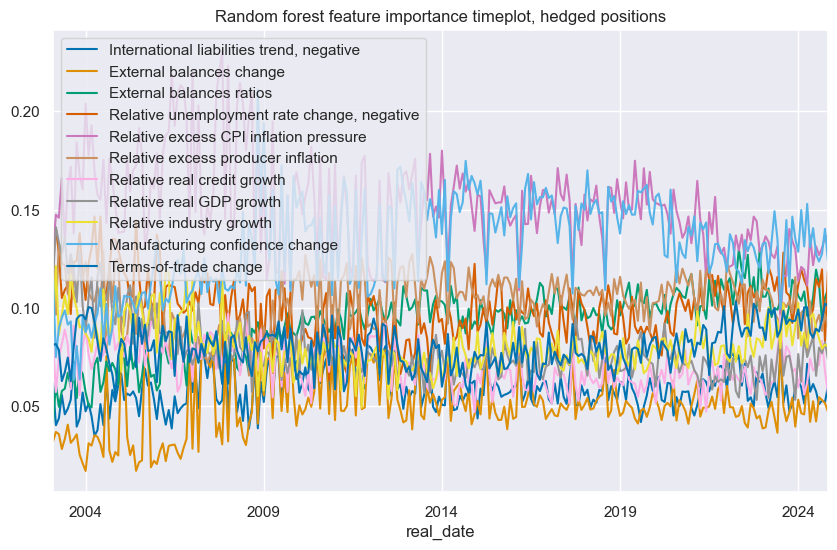

In [66]:
so_fxh.feature_importance_timeplot(
    "RFH",
    title="Random forest feature importance timeplot, hedged positions",
    ftrs_renamed=factorz_labs,
)

In [67]:
# Zn-scores

xcatx = ["LSH", "RFH"]
cidx = cids_fx

dfa = pd.DataFrame(columns=list(dfx.columns))

for xc in xcatx:
    dfaa = msp.make_zn_scores(
        dfx,
        xcat=xc,
        cids=cidx,
        sequential=True,
        min_obs=261 * 3,
        neutral="zero",
        pan_weight=1,
        thresh=3,
        postfix="Z",
        est_freq="m",
    )
    dfa = msm.update_df(dfa, dfaa)

dfx = msm.update_df(dfx, dfa)

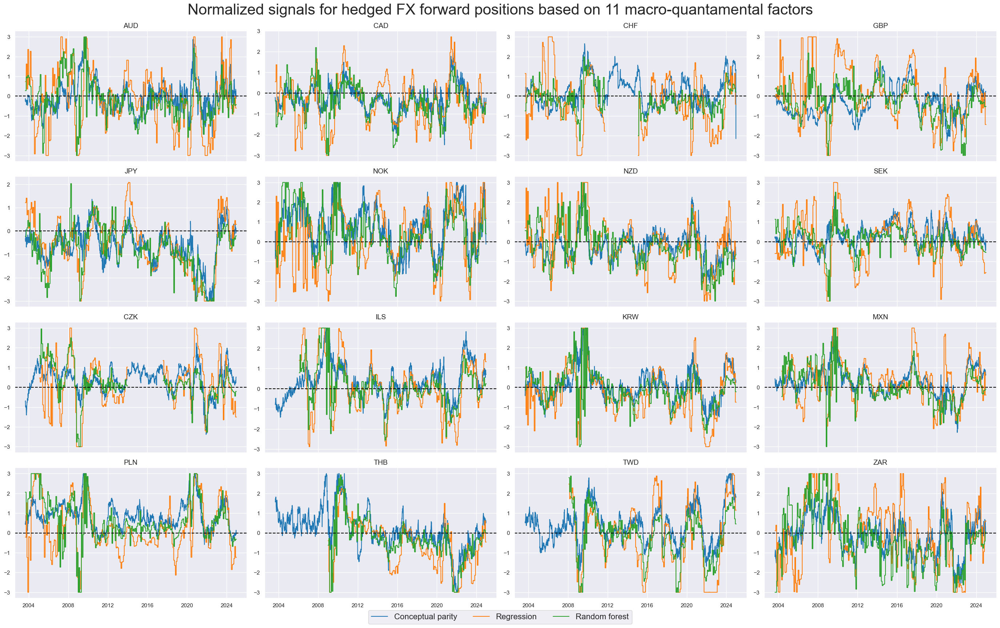

In [68]:
xcatx = ["ALL_AVGZ", "LSHZ", "RFHZ"]
cidx = cids_fx

msp.view_timelines(
    dfx,
    xcats=xcatx,
    cids=cidx,
    ncol=4,
    start="2003-08-29",
    title = "Normalized signals for hedged FX forward positions based on 11 macro-quantamental factors",
    xcat_labels = ["Conceptual parity", "Regression", "Random forest"],
    title_fontsize=30,
    same_y=False,
    cs_mean=False,
    legend_fontsize=16,
)

## Signal value checks

### Vol-targeted positions

#### Specs and panel test

In [69]:
cidx = cids_fx
sdate = "2003-08-29"

dict_fxv = {
    "sigs": ["ALL_AVGZ", "LSVZ", "RFVZ"],
    "targs": ["FXXR_VT10"],
    "cidx": cidx,
    "start": sdate,
    "black": fxblack,
    "srr": None,
    "pnls": None,
}

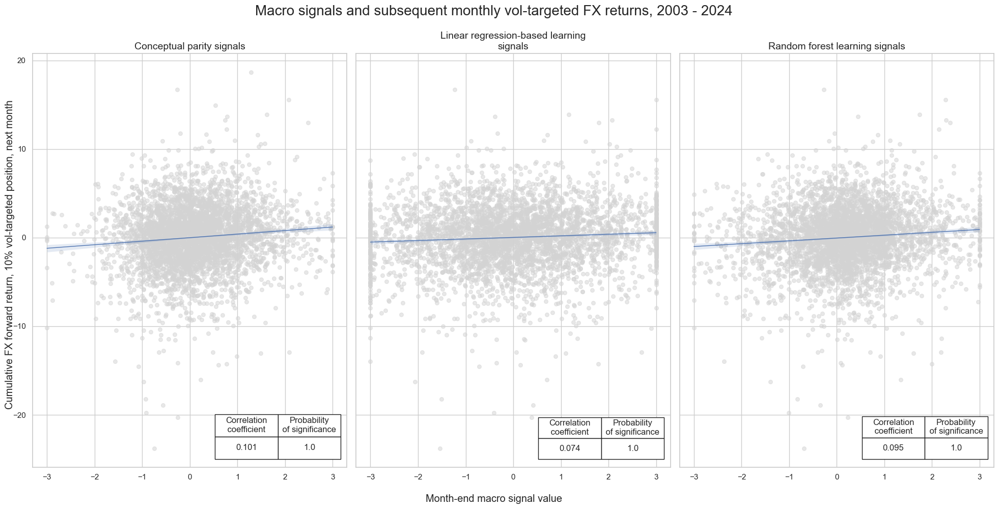

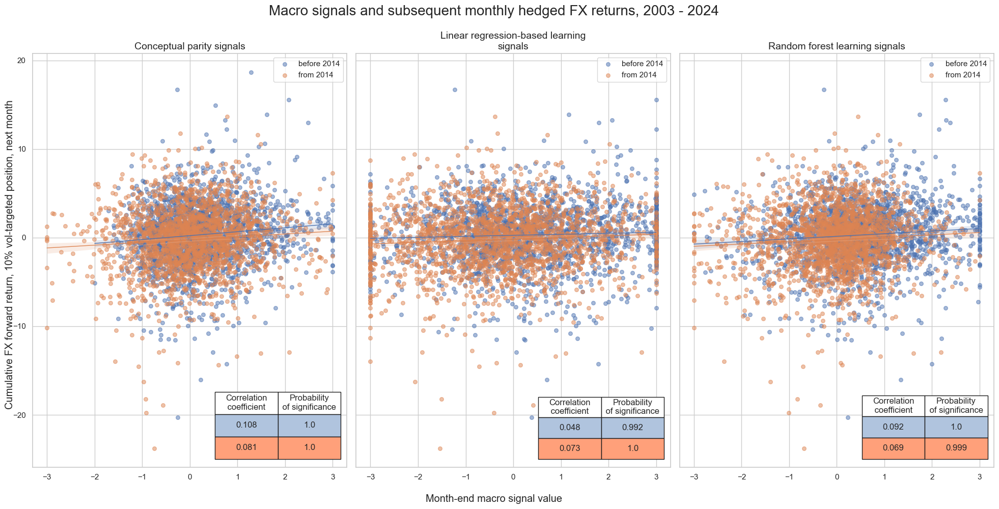

In [70]:
dix = dict_fxv

sigx = dix["sigs"]
tarx = dix["targs"]
cidx = dix["cidx"]
blax = dix["black"]
start = dix["start"]


def crmaker(sig, targ):
    crx = msp.CategoryRelations(
        dfx,
        xcats=[sig, targ],
        cids=cidx,
        freq="M",
        lag=1,
        xcat_aggs=["last", "sum"],
        start=start,
        blacklist=blax,
    )
    return crx


lcrs = [crmaker(sig, targ) for sig in sigx for targ in tarx]

msv.multiple_reg_scatter(
    lcrs,
    ncol=3,
    nrow=1,
    figsize=(20, 10),
    title="Macro signals and subsequent monthly vol-targeted FX returns, 2003 - 2024",
    xlab="Month-end macro signal value",
    ylab="Cumulative FX forward return, 10% vol-targeted position, next month",
    coef_box="lower right",
    prob_est="map",
    subplot_titles=[
        "Conceptual parity signals",
        "Linear regression-based learning signals",
        "Random forest learning signals",
    ],
)

msv.multiple_reg_scatter(
    lcrs,
    ncol=3,
    nrow=1,
    figsize=(20, 10),
    title="Macro signals and subsequent monthly hedged FX returns, 2003 - 2024",
    xlab="Month-end macro signal value",
    ylab="Cumulative FX forward return, 10% vol-targeted position, next month",
    coef_box="lower right",
    prob_est="map",
    subplot_titles=[
        "Conceptual parity signals",
        "Linear regression-based learning signals",
        "Random forest learning signals",
    ],
    separator=2014,
)

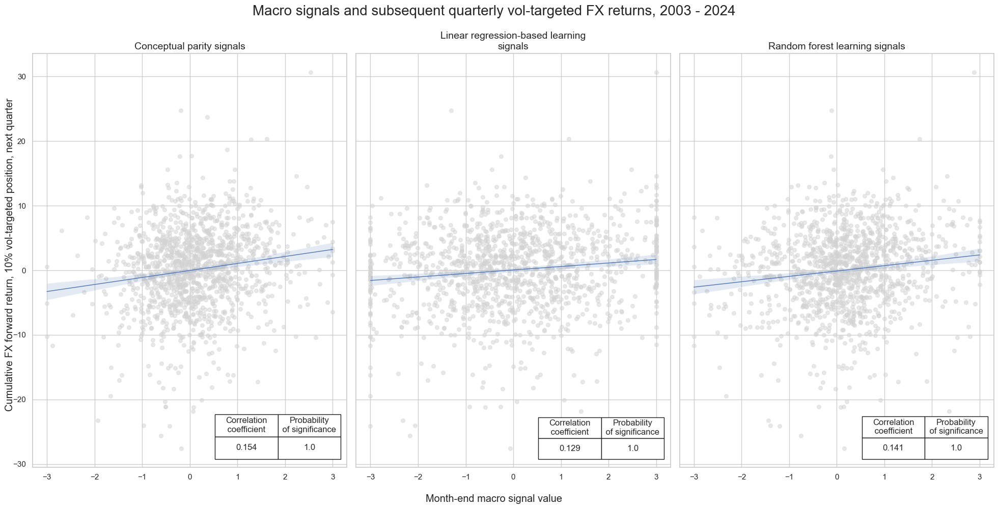

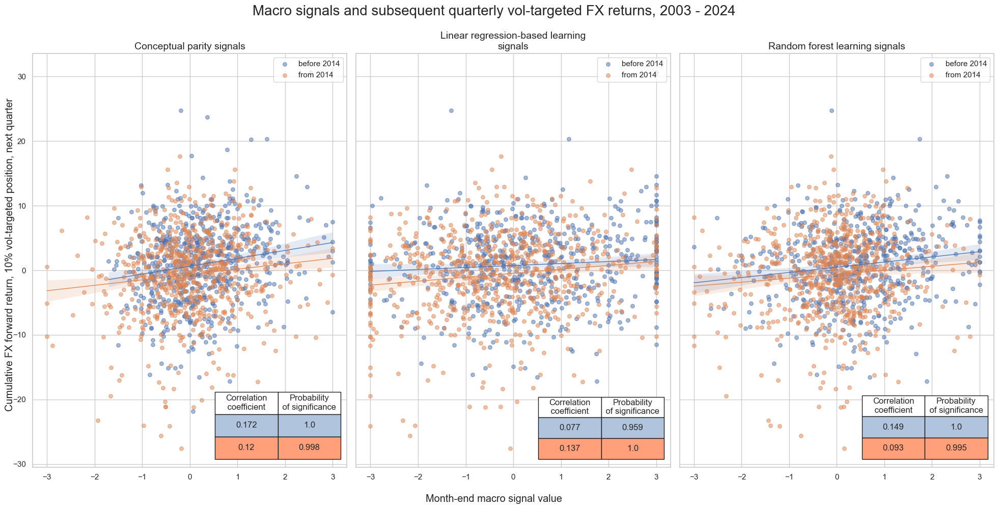

In [71]:
dix = dict_fxv

sigx = dix["sigs"]
tarx = dix["targs"]
cidx = dix["cidx"]
blax = dix["black"]
start = dix["start"]


def crmaker(sig, targ):
    crx = msp.CategoryRelations(
        dfx,
        xcats=[sig, targ],
        cids=cidx,
        freq="Q",
        lag=1,
        xcat_aggs=["last", "sum"],
        start=start,
        blacklist=blax,
    )
    return crx


lcrs = [crmaker(sig, targ) for sig in sigx for targ in tarx]

msv.multiple_reg_scatter(
    lcrs,
    ncol=3,
    nrow=1,
    figsize=(20, 10),
    title="Macro signals and subsequent quarterly vol-targeted FX returns, 2003 - 2024",
    xlab="Month-end macro signal value",
    ylab="Cumulative FX forward return, 10% vol-targeted position, next quarter",
    coef_box="lower right",
    prob_est="map",
    subplot_titles=[
        "Conceptual parity signals",
        "Linear regression-based learning signals",
        "Random forest learning signals",
    ],
)

msv.multiple_reg_scatter(
    lcrs,
    ncol=3,
    nrow=1,
    figsize=(20, 10),
    title="Macro signals and subsequent quarterly vol-targeted FX returns, 2003 - 2024",
    xlab="Month-end macro signal value",
    ylab="Cumulative FX forward return, 10% vol-targeted position, next quarter",
    coef_box="lower right",
    prob_est="map",
    subplot_titles=[
        "Conceptual parity signals",
        "Linear regression-based learning signals",
        "Random forest learning signals",
    ],
    separator=2014,
)

#### Accuracy and correlation check

In [72]:
## Compare optimized signals with simple average z-scores

dix = dict_fxv

sigx = dix["sigs"]
tarx = dix["targs"]
cidx = dix["cidx"]
blax = dix["black"]
startx = dix["start"]

srr = mss.SignalReturnRelations(
    df=dfx,
    rets=tarx,
    sigs=sigx,
    cids=cidx,
    cosp=True,
    freqs=["M"],
    agg_sigs=["last"],
    start=startx,
    blacklist=blax,
    slip=1,
    ms_panel_test=True,
)
dix["srr"] = srr

selcols = [
    "accuracy",
    "bal_accuracy",
    "pos_sigr",
    "pos_retr",
    "pearson",
    "map_pval",
    "kendall",
    "kendall_pval",
]

srr.multiple_relations_table().round(3)[selcols]

accuracy  bal_accuracy  pos_sigr  \
Return    Signal   Frequency Aggregation                                     
FXXR_VT10 ALL_AVGZ M         last            0.531         0.530     0.528   
          LSVZ     M         last            0.512         0.513     0.487   
          RFVZ     M         last            0.526         0.523     0.601   

                                          pos_retr  pearson  map_pval  \
Return    Signal   Frequency Aggregation                                
FXXR_VT10 ALL_AVGZ M         last            0.522    0.095       0.0   
          LSVZ     M         last            0.522    0.071       0.0   
          RFVZ     M         last            0.522    0.098       0.0   

                                          kendall  kendall_pval  
Return    Signal   Frequency Aggregation                         
FXXR_VT10 ALL_AVGZ M         last           0.059           0.0  
          LSVZ     M         last           0.041           0.0  
          RFVZ     M         last           0.060           0.0

#### Naive PnL

In [73]:
dix = dict_fxv

sigx = dix["sigs"]
tarx = dix["targs"]
cidx = dix["cidx"]
blax = dix["black"]
startx = dix["start"]

pnls = msn.NaivePnL(
    df=dfx,
    ret=tarx[0],
    sigs=sigx,
    cids=cidx,
    start=startx,
    blacklist=blax,
    bms=["USD_GB10YXR_NSA", "EUR_FXXR_NSA", "USD_EQXR_NSA"],
)
for sig in sigx:
    pnls.make_pnl(
        sig=sig,
        sig_op="raw",
        rebal_freq="monthly",
        neutral="zero",
        rebal_slip=1,
        vol_scale=10,
    )
pnls.make_long_pnl(vol_scale=10, label="Long only")

dix['pnls'] = pnls

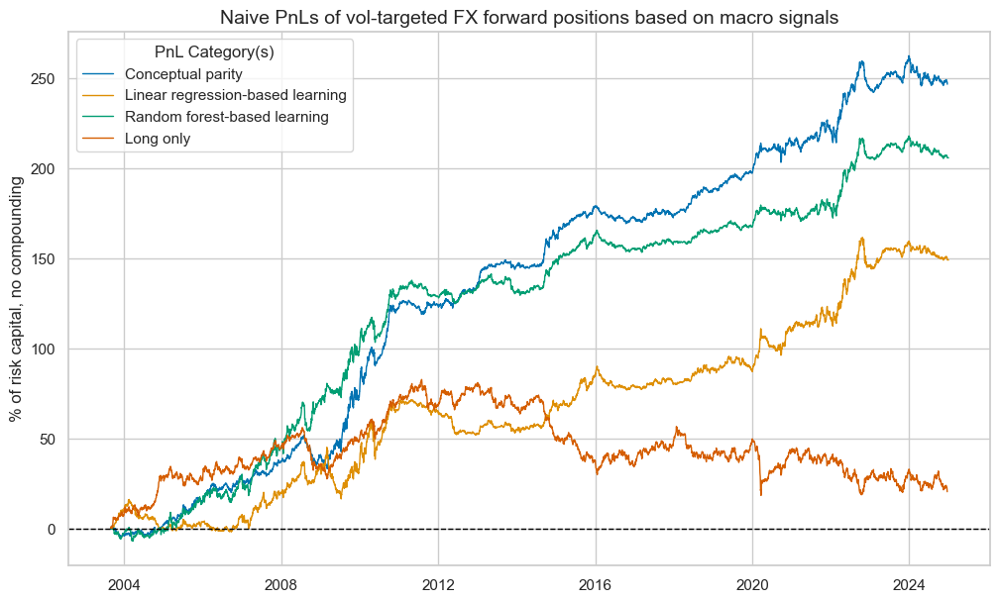

xcat,PNL_ALL_AVGZ,PNL_LSVZ,PNL_RFVZ,Long only
Return %,11.573196,6.991206,9.645992,0.967029
St. Dev. %,10.0,10.0,10.0,10.0
Sharpe Ratio,1.15732,0.699121,0.964599,0.096703
Sortino Ratio,1.759249,1.013046,1.414893,0.132339
Max 21-Day Draw %,-11.562754,-20.972745,-14.553378,-24.329186
Max 6-Month Draw %,-14.960068,-18.956451,-10.168273,-24.479089
Peak to Trough Draw %,-18.687284,-28.622746,-15.973817,-64.270266
Top 5% Monthly PnL Share,0.479377,0.724625,0.519515,4.494745
USD_GB10YXR_NSA correl,-0.107952,-0.05807,-0.063287,-0.008622
EUR_FXXR_NSA correl,-0.014618,-0.042602,0.030355,0.505311


In [74]:
dix = dict_fxv
pnls = dict_fxv["pnls"]
sigx = dix["sigs"]

pnls.plot_pnls(
    title="Naive PnLs of vol-targeted FX forward positions based on macro signals",
    title_fontsize=14,
    xcat_labels=[
        "Conceptual parity",
        "Linear regression-based learning",
        "Random forest-based learning",
        "Long only",
    ],
)
pnls.evaluate_pnls(pnl_cats=["PNL_" + sig for sig in sigx] + ["Long only"])

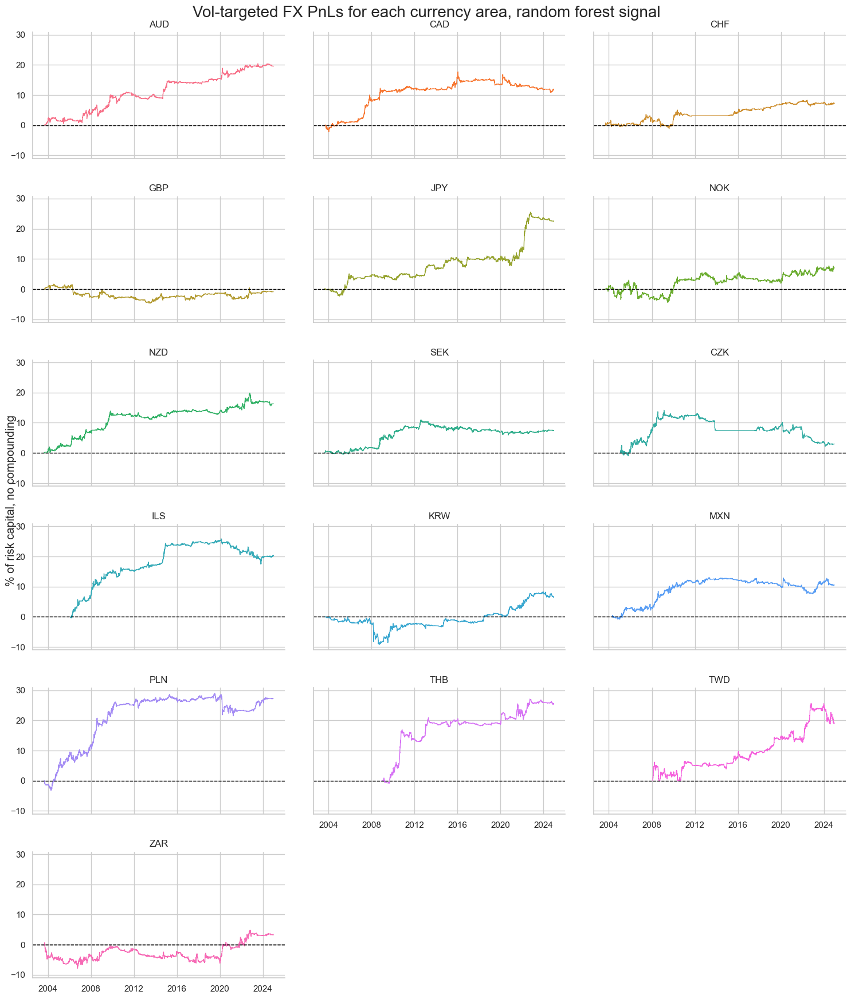

cid,AUD,CAD,CHF,CZK,GBP,ILS,JPY,KRW,MXN,NOK,NZD,PLN,SEK,THB,TWD,ZAR
Return %,0.916191,0.563574,0.40357,0.181651,-0.041862,1.069398,1.050794,0.304151,0.51101,0.32508,0.766878,1.283235,0.345011,1.588763,1.116021,0.149844
St. Dev. %,1.606308,1.419869,1.316372,1.99747,1.276242,1.80057,1.960339,1.714892,1.56284,2.222054,1.497604,2.33447,1.323055,1.975754,2.417985,2.062155
Sharpe Ratio,0.570371,0.39692,0.306578,0.090941,-0.032801,0.593922,0.536027,0.177359,0.326975,0.146297,0.51207,0.54969,0.260769,0.80413,0.46155,0.072664
Sortino Ratio,0.823092,0.575731,0.472787,0.143537,-0.04618,0.937302,0.796399,0.242347,0.462236,0.206906,0.741676,0.790419,0.378639,1.466272,0.769407,0.104174
Max 21-Day Draw %,-3.502589,-2.172801,-2.21007,-3.077397,-2.586212,-2.049386,-1.982875,-5.79044,-2.036673,-3.027575,-2.601862,-5.961496,-1.18196,-3.585332,-4.533752,-3.041174
Max 6-Month Draw %,-2.470959,-3.162021,-2.164,-3.605455,-3.302787,-2.819012,-2.510821,-7.106388,-2.55023,-4.89763,-3.452304,-4.858807,-1.262605,-4.212953,-6.066868,-4.811437
Peak to Trough Draw %,-3.804048,-6.812088,-4.795057,-11.963634,-6.325556,-8.464626,-3.280933,-9.272184,-5.382261,-7.451822,-4.249911,-7.43646,-5.05745,-5.249365,-6.915655,-8.481324
Top 5% Monthly PnL Share,0.837075,1.449536,1.606123,6.425507,-11.725726,1.007353,1.06243,2.412736,1.193445,2.712075,1.080883,0.879976,1.736402,1.192052,1.58733,6.780772
USD_GB10YXR_NSA correl,-0.011597,-0.031706,-0.005453,0.009301,0.017541,0.040662,-0.159795,-0.030107,-0.074606,-0.005592,-0.05054,-0.052828,-0.015632,-0.004054,0.0161,0.008854
EUR_FXXR_NSA correl,0.057203,-0.100224,0.040467,0.045255,-0.11448,0.238139,-0.213114,0.026429,0.092679,0.016609,0.090237,0.114813,-0.050312,-0.01881,0.041415,-0.088263


In [75]:
dix = dict_fxv
pnls = dix["pnls"]
sigx = dix["sigs"]


pnls.plot_pnls(pnl_cats=["PNL_RFVZ"], pnl_cids=cids_fx, facet=True, title = "Vol-targeted FX PnLs for each currency area, random forest signal")
pnls.evaluate_pnls(pnl_cats=["PNL_RFVZ"], pnl_cids=cids_fx)

### Hedged positions

#### Specs and panel test

In [76]:
cidx = cids_fx
sdate = "2003-08-29"

dict_fxh = {
    "sigs": ["ALL_AVGZ", "LSHZ", "RFHZ"],
    "targs": ["FXXRHvGDRB_NSA"],
    "cidx": cidx,
    "start": sdate,
    "black": fxblack,
    "srr": None,
    "pnls": None,
}

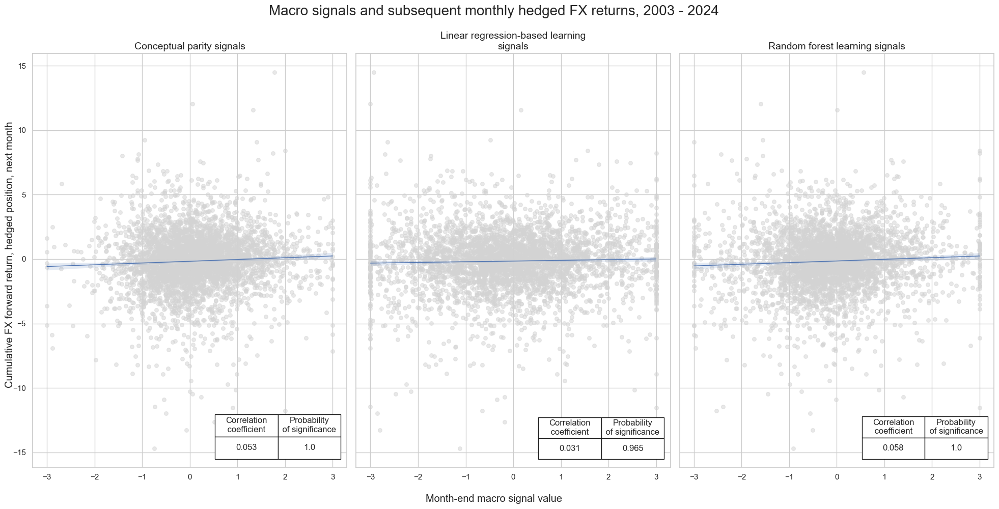

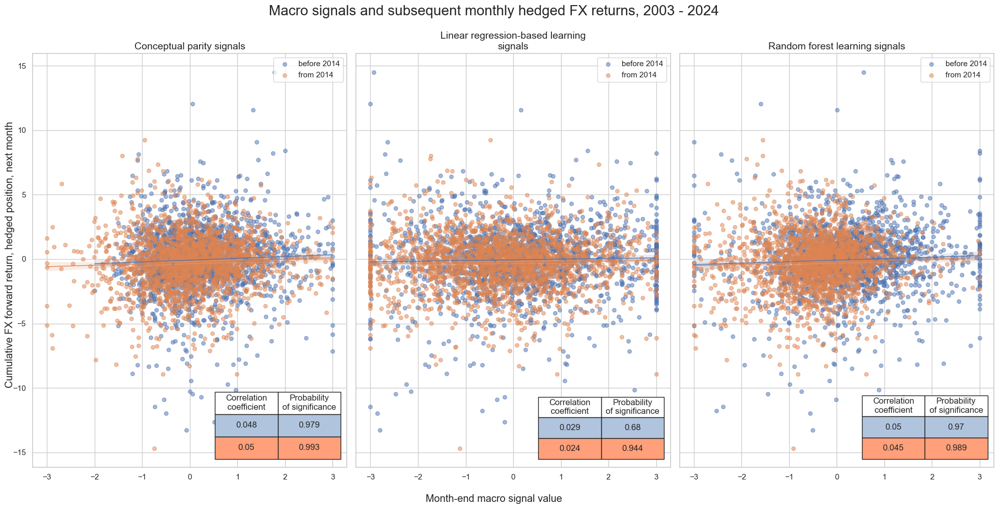

In [77]:
dix = dict_fxh

sigx = dix["sigs"]
tarx = dix["targs"]
cidx = dix["cidx"]
blax = dix["black"]
start = dix["start"]


def crmaker(sig, targ):
    crx = msp.CategoryRelations(
        dfx,
        xcats=[sig, targ],
        cids=cidx,
        freq="M",
        lag=1,
        xcat_aggs=["last", "sum"],
        start=start,
        blacklist=blax,
    )
    return crx


lcrs = [crmaker(sig, targ) for sig in sigx for targ in tarx]

msv.multiple_reg_scatter(
    lcrs,
    ncol=3,
    nrow=1,
    figsize=(20, 10),
    title="Macro signals and subsequent monthly hedged FX returns, 2003 - 2024",
    xlab="Month-end macro signal value",
    ylab="Cumulative FX forward return, hedged position, next month",
    coef_box="lower right",
    prob_est="map",
    subplot_titles=[
        "Conceptual parity signals",
        "Linear regression-based learning signals",
        "Random forest learning signals",
    ],
)

msv.multiple_reg_scatter(
    lcrs,
    ncol=3,
    nrow=1,
    figsize=(20, 10),
    title="Macro signals and subsequent monthly hedged FX returns, 2003 - 2024",
    xlab="Month-end macro signal value",
    ylab="Cumulative FX forward return, hedged position, next month",
    coef_box="lower right",
    prob_est="map",
    subplot_titles=[
        "Conceptual parity signals",
        "Linear regression-based learning signals",
        "Random forest learning signals",
    ],
    separator=2014,
)

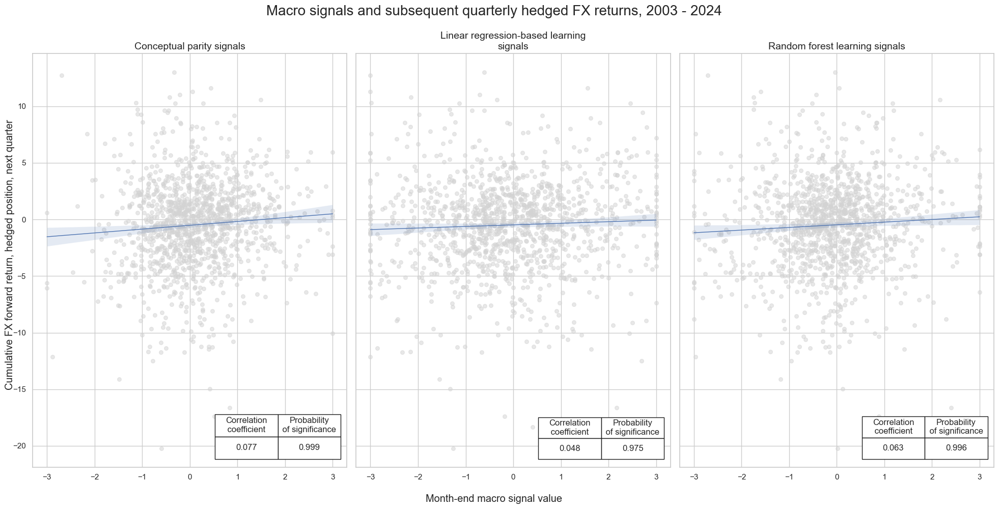

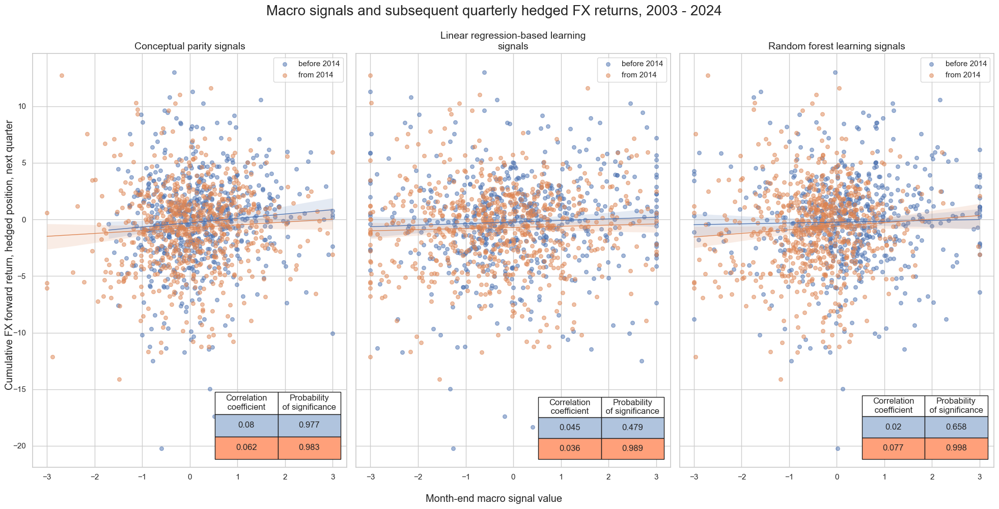

In [78]:
dix = dict_fxh

sigx = dix["sigs"]
tarx = dix["targs"]
cidx = dix["cidx"]
blax = dix["black"]
start = dix["start"]


def crmaker(sig, targ):
    crx = msp.CategoryRelations(
        dfx,
        xcats=[sig, targ],
        cids=cidx,
        freq="Q",
        lag=1,
        xcat_aggs=["last", "sum"],
        start=start,
        blacklist=blax,
    )
    return crx


lcrs = [crmaker(sig, targ) for sig in sigx for targ in tarx]

msv.multiple_reg_scatter(
    lcrs,
    ncol=3,
    nrow=1,
    figsize=(20, 10),
    title="Macro signals and subsequent quarterly hedged FX returns, 2003 - 2024",
    xlab="Month-end macro signal value",
    ylab="Cumulative FX forward return, hedged position, next quarter",
    coef_box="lower right",
    prob_est="map",
    subplot_titles=[
        "Conceptual parity signals",
        "Linear regression-based learning signals",
        "Random forest learning signals",
    ],
)

msv.multiple_reg_scatter(
    lcrs,
    ncol=3,
    nrow=1,
    figsize=(20, 10),
    title="Macro signals and subsequent quarterly hedged FX returns, 2003 - 2024",
    xlab="Month-end macro signal value",
    ylab="Cumulative FX forward return, hedged position, next quarter",
    coef_box="lower right",
    prob_est="map",
    subplot_titles=[
        "Conceptual parity signals",
        "Linear regression-based learning signals",
        "Random forest learning signals",
    ],
    separator=2014,
)

#### Accuracy and correlation check

In [79]:
## Compare optimized signals with simple average z-scores

dix = dict_fxh

sigx = dix["sigs"]
tarx = dix["targs"]
cidx = dix["cidx"]
blax = dix["black"]
startx = dix["start"]

srr = mss.SignalReturnRelations(
    df=dfx,
    rets=tarx,
    sigs=sigx,
    cids=cidx,
    cosp=True,
    freqs=["M"],
    agg_sigs=["last"],
    start=startx,
    blacklist=blax,
    slip=1,
    ms_panel_test=True,
)
dix["srr"] = srr

selcols = [
    "accuracy",
    "bal_accuracy",
    "pos_sigr",
    "pos_retr",
    "pearson",
    "map_pval",
    "kendall",
    "kendall_pval",
]

srr.multiple_relations_table().round(3)[selcols]

accuracy  bal_accuracy  \
Return         Signal   Frequency Aggregation                           
FXXRHvGDRB_NSA ALL_AVGZ M         last            0.528         0.529   
               LSHZ     M         last            0.509         0.508   
               RFHZ     M         last            0.534         0.532   

                                               pos_sigr  pos_retr  pearson  \
Return         Signal   Frequency Aggregation                                
FXXRHvGDRB_NSA ALL_AVGZ M         last            0.528     0.482    0.049   
               LSHZ     M         last            0.467     0.482    0.028   
               RFHZ     M         last            0.453     0.482    0.053   

                                               map_pval  kendall  kendall_pval  
Return         Signal   Frequency Aggregation                                   
FXXRHvGDRB_NSA ALL_AVGZ M         last            0.000    0.042         0.000  
               LSHZ     M         last            0.038    0.018         0.091  
               RFHZ     M         last            0.001    0.047         0.000

#### Naive PnL

In [80]:
dix = dict_fxh

sigx = dix["sigs"]
tarx = dix["targs"]
cidx = dix["cidx"]
blax = dix["black"]
startx = dix["start"]

pnls = msn.NaivePnL(
    df=dfx,
    ret=tarx[0],
    sigs=sigx,
    cids=cidx,
    start=startx,
    blacklist=blax,
    bms=["USD_GB10YXR_NSA", "EUR_FXXR_NSA", "USD_EQXR_NSA"],
)
for sig in sigx:
    pnls.make_pnl(
        sig=sig,
        sig_op="raw",
        rebal_freq="monthly",
        neutral="zero",
        rebal_slip=1,
        vol_scale=10,
    )
pnls.make_long_pnl(vol_scale=10, label="Long only")

dix["pnls"] = pnls

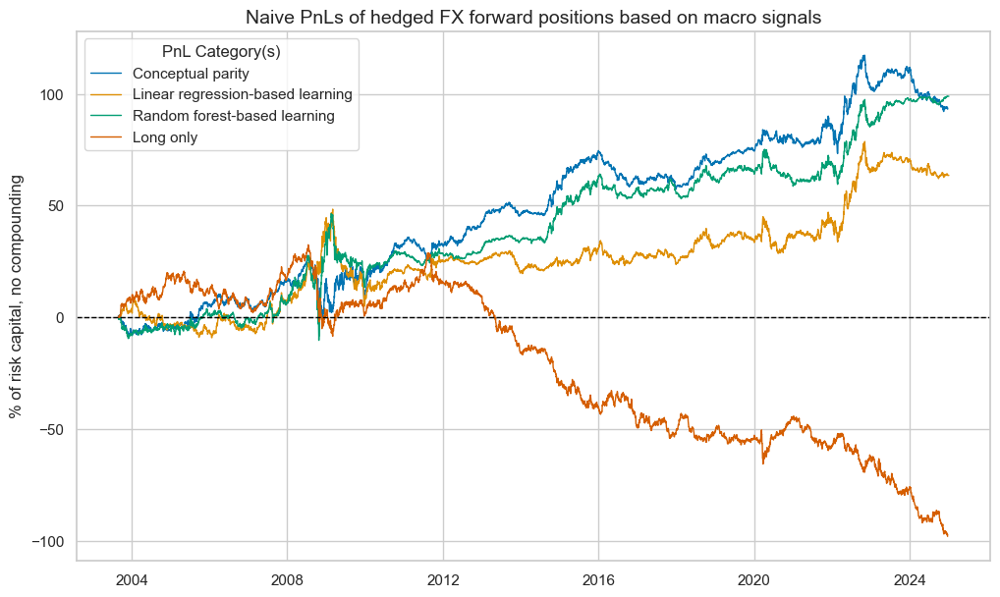

xcat,PNL_ALL_AVGZ,PNL_LSHZ,PNL_RFHZ,Long only
Return %,4.371751,2.97701,4.635429,-4.595695
St. Dev. %,10.0,10.0,10.0,10.0
Sharpe Ratio,0.437175,0.297701,0.463543,-0.45957
Sortino Ratio,0.634468,0.419443,0.647475,-0.628564
Max 21-Day Draw %,-20.193632,-15.243791,-26.888151,-23.712188
Max 6-Month Draw %,-23.852403,-28.851387,-24.264262,-33.29414
Peak to Trough Draw %,-28.924819,-43.47515,-38.002827,-130.39716
Top 5% Monthly PnL Share,1.080057,1.597565,1.059348,-0.660979
USD_GB10YXR_NSA correl,-0.07334,-0.0184,-0.061603,0.149457
EUR_FXXR_NSA correl,-0.079704,-0.18641,-0.166692,0.499291


In [81]:
dix = dict_fxh
pnls = dix["pnls"]
sigx = dix["sigs"]

pnls.plot_pnls(
    title="Naive PnLs of hedged FX forward positions based on macro signals",
    title_fontsize=14,
    xcat_labels=[
        "Conceptual parity",
        "Linear regression-based learning",
        "Random forest-based learning",
        "Long only",
    ],
)
pnls.evaluate_pnls(pnl_cats=["PNL_" + sig for sig in sigx] + ["Long only"])

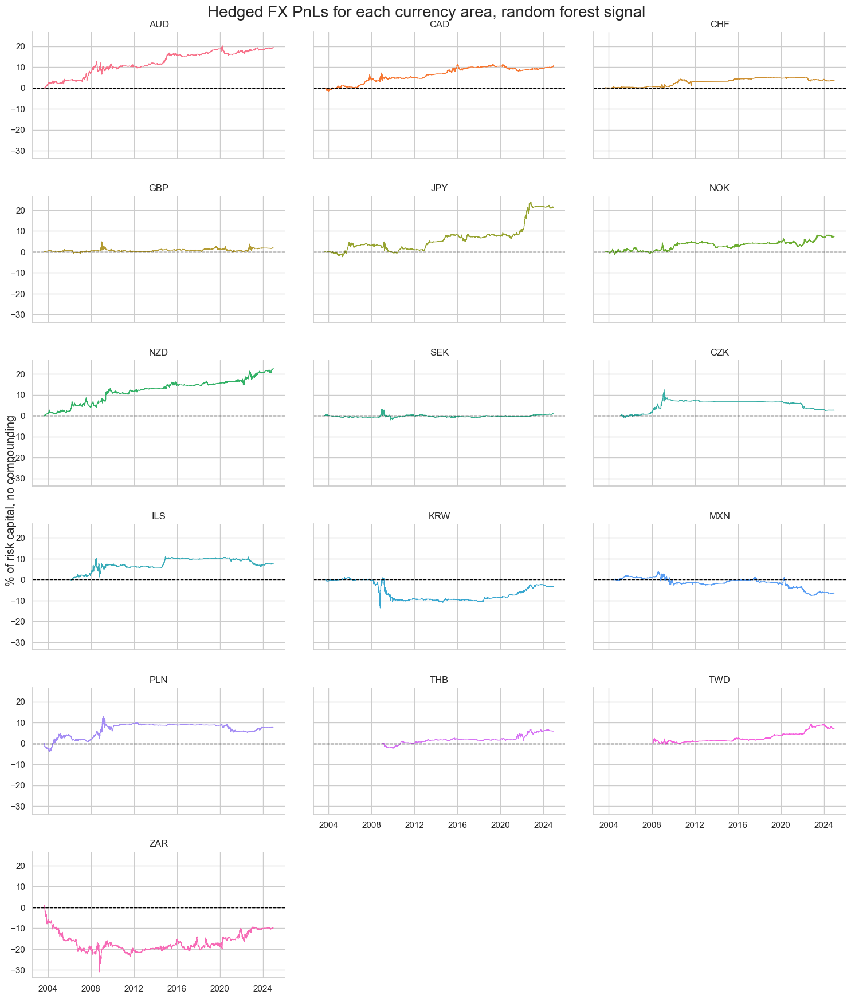

cid,AUD,CAD,CHF,CZK,GBP,ILS,JPY,KRW,MXN,NOK,NZD,PLN,SEK,THB,TWD,ZAR
Return %,0.914134,0.500497,0.198047,0.160895,0.084854,0.402986,1.008701,-0.153109,-0.309631,0.339651,1.065441,0.354967,0.033853,0.372088,0.415826,-0.462428
St. Dev. %,2.185229,1.605812,0.860307,1.464976,1.452942,1.98409,2.107353,2.711666,1.775893,1.662936,2.031713,2.017494,0.979363,1.056361,1.009289,3.967962
Sharpe Ratio,0.418324,0.311678,0.230205,0.109828,0.058402,0.203109,0.478658,-0.056463,-0.174352,0.204248,0.524405,0.175944,0.034566,0.352236,0.411999,-0.11654
Sortino Ratio,0.599076,0.430168,0.372181,0.18357,0.083173,0.305251,0.684705,-0.083776,-0.250708,0.290343,0.778096,0.248668,0.049728,0.583566,0.678884,-0.160722
Max 21-Day Draw %,-4.458108,-3.200651,-1.956676,-4.463537,-3.35628,-6.409828,-2.231307,-7.319215,-3.470926,-3.433432,-2.840344,-2.777292,-2.904183,-1.763307,-2.089691,-12.418258
Max 6-Month Draw %,-5.954793,-3.004945,-2.376887,-4.955997,-3.887387,-5.732091,-4.644383,-11.366033,-4.931902,-3.891563,-3.874994,-5.503784,-3.397354,-2.121334,-2.261274,-9.033691
Peak to Trough Draw %,-6.145171,-3.742913,-3.393439,-10.069927,-5.075318,-8.833061,-5.374178,-14.582551,-11.696147,-4.381968,-4.609159,-7.610126,-5.175616,-3.418658,-3.001471,-32.100931
Top 5% Monthly PnL Share,0.909814,1.20764,2.3932,5.141337,5.962226,2.651177,1.125075,-5.44129,-1.856367,2.132598,1.060932,2.472955,11.25977,1.953303,1.596115,-3.063043
USD_GB10YXR_NSA correl,-0.03272,-0.032432,-0.008826,0.085455,0.00486,0.031284,-0.183631,-0.009299,-0.015709,0.013866,-0.092184,0.016045,0.052612,-0.036613,0.000053,-0.025174
EUR_FXXR_NSA correl,-0.16552,-0.23948,0.054663,-0.058671,-0.101999,0.114717,-0.245962,0.00816,-0.009367,-0.031542,-0.06326,-0.015122,-0.0608,-0.155909,-0.051019,-0.001058


In [82]:
dix = dict_fxh
pnls = dix["pnls"]
sigx = dix["sigs"]


pnls.plot_pnls(pnl_cats=["PNL_RFHZ"], pnl_cids=cids_fx, facet=True, title = "Hedged FX PnLs for each currency area, random forest signal")
pnls.evaluate_pnls(pnl_cats=["PNL_RFHZ"], pnl_cids=cids_fx)